# Creating Numbers/images with AI: A Hands-on Diffusion Model Exercise

## Introduction
In this assignment, you'll learn how to create an AI model that can generate realistic images from scratch using a powerful technique called 'diffusion'. Think of it like teaching AI to draw by first learning how images get blurry and then learning to make them clear again.

### What We'll Build
- A diffusion model capable of generating realistic images
- For most students: An AI that generates handwritten digits (0-9) using the MNIST dataset
- For students with more computational resources: Options to work with more complex datasets
- Visual demonstrations of how random noise gradually transforms into clear, recognizable images
- By the end, your AI should create images realistic enough for another AI to recognize them

### Dataset Options
This lab offers flexibility based on your available computational resources:

- Standard Option (Free Colab): We'll primarily use the MNIST handwritten digit dataset, which works well with limited GPU memory and completes training in a reasonable time frame. Most examples and code in this notebook are optimized for MNIST.

- Advanced Option: If you have access to more powerful GPUs (either through Colab Pro/Pro+ or your own hardware), you can experiment with more complex datasets like Fashion-MNIST, CIFAR-10, or even face generation. You'll need to adapt the model architecture, hyperparameters, and evaluation metrics accordingly.

### Resource Requirements
- Basic MNIST: Works with free Colab GPUs (2-4GB VRAM), ~30 minutes training
- Fashion-MNIST: Similar requirements to MNIST
CIFAR-10: Requires more memory (8-12GB VRAM) and longer training (~2 hours)
- Higher resolution images: Requires substantial GPU resources and several hours of training

### Before You Start
1. Make sure you're running this in Google Colab or another environment with GPU access
2. Go to 'Runtime' → 'Change runtime type' and select 'GPU' as your hardware accelerator
3. Each code cell has comments explaining what it does
4. Don't worry if you don't understand every detail - focus on the big picture!
5. If working with larger datasets, monitor your GPU memory usage carefully

The concepts you learn with MNIST will scale to more complex datasets, so even if you're using the basic option, you'll gain valuable knowledge about generative AI that applies to more advanced applications.



## Step 1: Setting Up Our Tools
First, let's install and import all the tools we need. Run this cell and wait for it to complete.

In [1]:
# Step 1: Install required packages
%pip install einops
print("Package installation complete.")

# Step 2: Import libraries
# --- Core PyTorch libraries ---
import torch  # Main deep learning framework
import torch.nn.functional as F  # Neural network functions like activation functions
import torch.nn as nn  # Neural network building blocks (layers)
from torch.optim import Adam  # Optimization algorithm for training

# --- Data handling ---
from torch.utils.data import Dataset, DataLoader  # For organizing and loading our data
import torchvision  # Library for computer vision datasets and models
import torchvision.transforms as transforms  # For preprocessing images

# --- Tensor manipulation ---
import random  # For random operations
from einops.layers.torch import Rearrange  # For reshaping tensors in neural networks
from einops import rearrange  # For elegant tensor reshaping operations
import numpy as np  # For numerical operations on arrays

# --- System utilities ---
import os  # For operating system interactions (used for CPU count)

# --- Visualization tools ---
import matplotlib.pyplot as plt  # For plotting images and graphs
from PIL import Image  # For image processing
from torchvision.utils import save_image, make_grid  # For saving and displaying image grids

# Step 3: Set up device (GPU or CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"We'll be using: {device}")

# Check if we're actually using GPU (for students to verify)
if device.type == "cuda":
    print(f"GPU name: {torch.cuda.get_device_name(0)}")
    print(f"GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("Note: Training will be much slower on CPU. Consider using Google Colab with GPU enabled.")

Package installation complete.
We'll be using: cuda
GPU name: Tesla T4
GPU memory: 15.83 GB



###  REPRODUCIBILITY AND DEVICE SETUP

In [2]:
# Step 4: Set random seeds for reproducibility
# Diffusion models are sensitive to initialization, so reproducible results help with debugging
SEED = 42  # Universal seed value for reproducibility
torch.manual_seed(SEED)          # PyTorch random number generator
np.random.seed(SEED)             # NumPy random number generator
random.seed(SEED)                # Python's built-in random number generator

print(f"Random seeds set to {SEED} for reproducible results")

# Configure CUDA for GPU operations if available
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)       # GPU random number generator
    torch.cuda.manual_seed_all(SEED)   # All GPUs random number generator

    # Ensure deterministic GPU operations
    # Note: This slightly reduces performance but ensures results are reproducible
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    try:
        # Check available GPU memory
        gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9  # Convert to GB
        print(f"Available GPU Memory: {gpu_memory:.1f} GB")

        # Add recommendation based on memory
        if gpu_memory < 4:
            print("Warning: Low GPU memory. Consider reducing batch size if you encounter OOM errors.")
    except Exception as e:
        print(f"Could not check GPU memory: {e}")
else:
    print("No GPU detected. Training will be much slower on CPU.")
    print("If you're using Colab, go to Runtime > Change runtime type and select GPU.")

Random seeds set to 42 for reproducible results
Available GPU Memory: 15.8 GB


## Step 2: Choosing Your Dataset

You have several options for this exercise, depending on your computer's capabilities:

### Option 1: MNIST (Basic - Works on Free Colab)
- Content: Handwritten digits (0-9)
- Image size: 28x28 pixels, Grayscale
- Training samples: 60,000
- Memory needed: ~2GB GPU
- Training time: ~15-30 minutes on Colab
- **Choose this if**: You're using free Colab or have a basic GPU

### Option 2: Fashion-MNIST (Intermediate)
- Content: Clothing items (shirts, shoes, etc.)
- Image size: 28x28 pixels, Grayscale
- Training samples: 60,000
- Memory needed: ~2GB GPU
- Training time: ~15-30 minutes on Colab
- **Choose this if**: You want more interesting images but have limited GPU

### Option 3: CIFAR-10 (Advanced)
- Content: Real-world objects (cars, animals, etc.)
- Image size: 32x32 pixels, Color (RGB)
- Training samples: 50,000
- Memory needed: ~4GB GPU
- Training time: ~1-2 hours on Colab
- **Choose this if**: You have Colab Pro or a good local GPU (8GB+ memory)

### Option 4: CelebA (Expert)
- Content: Celebrity face images
- Image size: 64x64 pixels, Color (RGB)
- Training samples: 200,000
- Memory needed: ~8GB GPU
- Training time: ~3-4 hours on Colab
- **Choose this if**: You have excellent GPU (12GB+ memory)

To use your chosen dataset, uncomment its section in the code below and make sure all others are commented out.

In [3]:
#===============================================================================
# SECTION 2: DATASET SELECTION AND CONFIGURATION
#===============================================================================

#-------------------------------------------
# OPTION 1: Regular MNIST (Basic - 2GB GPU)
#-------------------------------------------

from torch.utils.data import DataLoader, random_split

IMG_SIZE = 28
IMG_CH = 1
N_CLASSES = 10
BATCH_SIZE = 64
EPOCHS = 30

# Define preprocessing steps
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Scale from [0,1] to [-1,1]
])

# Load the dataset
train_dataset_full = torchvision.datasets.MNIST(root='.', train=True, download=True, transform=transform)

# Create train/validation split
train_size = int(0.8 * len(train_dataset_full))
val_size = len(train_dataset_full) - train_size
train_dataset, val_dataset = random_split(
    train_dataset_full,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(SEED)  # Reproducible split
)

# Define DataLoaders
BATCH_SIZE = 64

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(f"Loaded {len(train_dataset)} training samples and {len(val_dataset)} validation samples.")


Loaded 48000 training samples and 12000 validation samples.


In [4]:
# Validating Dataset Selection
# Let's validate that a dataset was selected
# and check if your GPU has enough memory:

# Validate dataset selection
if 'train_dataloader' not in locals():
    raise ValueError("""
    ❌ ERROR: No dataset selected! Please uncomment exactly one dataset option.
    Available options:
    1. MNIST (Basic) - 2GB GPU
    """)

# GPU memory check
if torch.cuda.is_available():
    gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9  # Convert to GB
    print(f"Available GPU Memory: {gpu_memory:.1f} GB")

    # Regular MNIST needs about ~2GB, so we’ll use that as reference
    required_memory = 2.0

    if gpu_memory < required_memory:
        print(f"⚠️ WARNING: Available GPU memory ({gpu_memory:.1f} GB) is less than the recommended {required_memory:.1f} GB for MNIST.")
        print("You may encounter out-of-memory errors. Try lowering the batch size.")
    else:
        print("✅ GPU memory is sufficient for MNIST.")
else:
    print("⚠️ No GPU detected. Training will be much slower on CPU.")


Available GPU Memory: 15.8 GB
✅ GPU memory is sufficient for MNIST.


In [5]:
# Dataset Properties and Data Loaders
from torch.utils.data import random_split

sample_batch = next(iter(DataLoader(train_dataset, batch_size=1)))
sample_image, sample_label = sample_batch

print("Sample Image Properties:")
print(f"  Shape: {sample_image.shape}")
print(f"  Type: {sample_image.dtype}")
print(f"  Value Range: [{sample_image.min().item()}, {sample_image.max().item()}]")
print(f"Sample Label: {sample_label.item()}")

# Train-Validation Split
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
generator1 = torch.Generator().manual_seed(42)

# Rename to avoid overwriting original `train_dataset`
train_subset, val_subset = random_split(train_dataset, [train_size, val_size], generator=generator1)


# Data Loaders
train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"✅ Train dataset size: {len(train_subset)}")
print(f"✅ Validation dataset size: {len(val_subset)}")

# ✅ Override naming for clarity and consistency with other cells
train_dataloader = train_loader
val_dataloader = val_loader



Sample Image Properties:
  Shape: torch.Size([1, 1, 28, 28])
  Type: torch.float32
  Value Range: [-1.0, 1.0]
Sample Label: 6
✅ Train dataset size: 38400
✅ Validation dataset size: 9600


## Step 3: Building Our Model Components

Now we'll create the building blocks of our AI model. Think of these like LEGO pieces that we'll put together to make our number generator:

- GELUConvBlock: The basic building block that processes images
- DownBlock: Makes images smaller while finding important features
- UpBlock: Makes images bigger again while keeping the important features
- Other blocks: Help the model understand time and what number to generate

In [6]:
# Basic building block that processes images
import torch.nn as nn

# Basic building block that processes images
class GELUConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, group_size):
        """
        Creates a block with convolution, normalization, and activation

        Args:
            in_ch (int): Number of input channels
            out_ch (int): Number of output channels
            group_size (int): Number of groups for GroupNorm
        """
        super().__init__()

        # Check that group_size is compatible with out_ch
        if out_ch % group_size != 0:
            print(f"Warning: out_ch ({out_ch}) is not divisible by group_size ({group_size})")
            # Adjust group_size to be compatible
            group_size = min(group_size, out_ch)
            while out_ch % group_size != 0:
                group_size -= 1
            print(f"Adjusted group_size to {group_size}")

        # Create layers for the block
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.GroupNorm(group_size, out_ch),
            nn.GELU()
        )

    def forward(self, x):
        # Forward pass
        return self.block(x)

In [7]:
# Rearranges pixels to downsample the image (2x reduction in spatial dimensions)
import torch.nn as nn
from einops.layers.torch import Rearrange

class RearrangePoolBlock(nn.Module):
    def __init__(self, in_chs, group_size):
        """
        Downsamples the spatial dimensions by 2x while preserving information

        Args:
            in_chs (int): Number of input channels
            group_size (int): Number of groups for GroupNorm
        """
        super().__init__()

        self.rearrange_pool = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (c p1 p2) h w', p1=2, p2=2),  # Output: [B, C*4, H/2, W/2]
            GELUConvBlock(in_chs * 4, in_chs * 2, group_size)              # Now just go from C*4 → C*2
        )

    def forward(self, x):
        return self.rearrange_pool(x)


In [8]:
#Let's implement the upsampling block for our U-Net architecture:
import torch.nn as nn

class DownBlock(nn.Module):
    """
    Downsampling block for encoding path in U-Net architecture.

    This block:
    1. Processes input features with two convolutional blocks
    2. Downsamples spatial dimensions by 2x using pixel rearrangement

    Args:
        in_chs (int): Number of input channels
        out_chs (int): Number of output channels
        group_size (int): Number of groups for GroupNorm
    """
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()

        # Sequential processing of features
        layers = [
            GELUConvBlock(in_chs, out_chs, group_size),  # First conv block changes channel dimensions
            GELUConvBlock(out_chs, out_chs, group_size),  # Second conv block processes features
            RearrangePoolBlock(out_chs, group_size)        # Downsampling (spatial dims: H,W → H/2,W/2)
        ]
        self.model = nn.Sequential(*layers)

        # Log the configuration for debugging
        print(f"Created DownBlock: in_chs={in_chs}, out_chs={out_chs}, spatial_reduction=2x")

    def forward(self, x):
        """
        Forward pass through the DownBlock.

        Args:
            x (torch.Tensor): Input tensor of shape [B, in_chs, H, W]

        Returns:
            torch.Tensor: Output tensor of shape [B, out_chs, H/2, W/2]
        """
        return self.model(x)

In [9]:
#Now let's implement the upsampling block for our U-Net architecture:
import torch
import torch.nn as nn

class UpBlock(nn.Module):
    """
    Upsampling block for decoding path in U-Net architecture.

    This block:
    1. Takes features from the decoding path and corresponding skip connection
    2. Concatenates them along the channel dimension
    3. Upsamples spatial dimensions by 2x using transposed convolution
    4. Processes features through multiple convolutional blocks

    Args:
        in_chs (int): Number of input channels from the previous layer
        out_chs (int): Number of output channels
        group_size (int): Number of groups for GroupNorm
    """
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()

        # Upsampling operation
        self.upsample = nn.ConvTranspose2d(in_chs, out_chs, kernel_size=2, stride=2)

        # Convolutional blocks after concatenation (doubles the channels)
        self.conv_blocks = nn.Sequential(
            GELUConvBlock(out_chs * 2, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size)
        )

        # Log the configuration for debugging
        print(f"Created UpBlock: in_chs={in_chs}, out_chs={out_chs}, spatial_increase=2x")

    def forward(self, x, skip):
        """
        Forward pass through the UpBlock.

        Args:
            x (torch.Tensor): Input tensor from previous layer [B, in_chs, H, W]
            skip (torch.Tensor): Skip connection tensor from encoder [B, out_chs, 2H, 2W]

        Returns:
            torch.Tensor: Output tensor with shape [B, out_chs, 2H, 2W]
        """
        x = self.upsample(x)
        x = torch.cat([x, skip], dim=1)  # Concatenate along channel dimension
        return self.conv_blocks(x)



In [10]:
# Here we implement the time embedding block for our U-Net architecture:
import torch
import torch.nn as nn

# Helps the model understand time steps in diffusion process
class SinusoidalPositionEmbedBlock(nn.Module):
    """
    Creates sinusoidal embeddings for time steps in diffusion process.

    This embedding scheme is adapted from the Transformer architecture and
    provides a unique representation for each time step that preserves
    relative distance information.

    Args:
        dim (int): Embedding dimension
    """
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        """
        Computes sinusoidal embeddings for given time steps.

        Args:
            time (torch.Tensor): Time steps tensor of shape [batch_size]

        Returns:
            torch.Tensor: Time embeddings of shape [batch_size, dim]
        """
        time = time.float()  # ✅ Ensure time is float for multiplication
        device = time.device
        half_dim = self.dim // 2
        embeddings = torch.log(torch.tensor(10000.0, device=device)) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


In [11]:
# Helps the model understand which number/image to draw (class conditioning)
import torch
import torch.nn as nn

class EmbedBlock(nn.Module):
    """
    Creates embeddings for class conditioning using class indices.

    Args:
        num_classes (int): Number of classes (e.g., 10 for MNIST)
        emb_dim (int): Output embedding dimension
    """
    def __init__(self, num_classes, emb_dim):
        super().__init__()
        self.embed = nn.Embedding(num_classes, emb_dim)

    def forward(self, x):
        """
        Args:
            x (torch.Tensor): Class indices [batch_size]

        Returns:
            torch.Tensor: Embeddings [batch_size, emb_dim, 1, 1]
        """
        x = self.embed(x)                # [B, emb_dim]
        return x[:, :, None, None]       # [B, emb_dim, 1, 1] for broadcasting


In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Sinusoidal Time Embedding Block
class SinusoidalPositionEmbedBlock(nn.Module):
    def __init__(self, embed_dim):
        super().__init__()
        self.embed_dim = embed_dim

    def forward(self, t):
        t = t.float()
        half_dim = self.embed_dim // 2
        embeddings = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=t.device) * -embeddings)
        embeddings = t[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

# Class Embedding Block (expects class indices)
class EmbedBlock(nn.Module):
    def __init__(self, num_classes, embed_dim):
        super().__init__()
        self.embed = nn.Embedding(num_classes, embed_dim)

    def forward(self, c):
        return self.embed(c)

# GELU Conv Block
class GELUConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size, padding=kernel_size // 2),
            nn.GELU(),
            nn.Conv2d(out_ch, out_ch, kernel_size, padding=kernel_size // 2)
        )

    def forward(self, x):
        return self.block(x)

# Downsampling Block
class DownBlock(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size):
        super().__init__()
        self.block = nn.Sequential(
            GELUConvBlock(in_ch, out_ch, kernel_size),
            nn.AvgPool2d(2)
        )

    def forward(self, x):
        return self.block(x)

# Upsampling Block
class UpBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, kernel_size):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode='nearest')
        self.conv = GELUConvBlock(in_ch + skip_ch, out_ch, kernel_size)

    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)



In [13]:
# Full U-Net Model
class UNet(nn.Module):
    def __init__(self, T, img_ch, img_size, down_chs, t_embed_dim, c_embed_dim):
        super().__init__()

        self.time_embed = nn.Sequential(
            SinusoidalPositionEmbedBlock(t_embed_dim),
            nn.Linear(t_embed_dim, t_embed_dim),
            nn.GELU()
        )

        self.class_embed = EmbedBlock(10, c_embed_dim)  # MNIST = 10 digits

        self.init_conv = GELUConvBlock(img_ch, down_chs[0], 3)

        self.down_blocks = nn.ModuleList([
            DownBlock(down_chs[i], down_chs[i+1], 3) for i in range(len(down_chs)-1)
        ])

        self.middle_blocks = nn.Sequential(
            GELUConvBlock(down_chs[-1], down_chs[-1], 3),
            GELUConvBlock(down_chs[-1], down_chs[-1], 3)
        )

        self.up_blocks = nn.ModuleList([
            UpBlock(in_ch=down_chs[i+1], skip_ch=down_chs[i], out_ch=down_chs[i], kernel_size=3)
            for i in reversed(range(len(down_chs)-1))
        ])


        self.final_conv = nn.Conv2d(down_chs[0], img_ch, kernel_size=1)

        print(f"✅ Created UNet with {len(down_chs)} scale levels")
        print(f"Channel dimensions: {down_chs}")

    def forward(self, x, t, c, c_mask):
        print("🚀 FORWARD STARTED")
        print("x input:", x.shape)
        print("t input:", t.shape)
        print("c input:", c.shape)
        print("c_mask input:", c_mask.shape)

        # Initial conv
        x = self.init_conv(x)

        # Downsampling
        skips = []
        for down_block in self.down_blocks:
            skips.append(x)
            x = down_block(x)


        # Middle blocks
        x = self.middle_blocks(x)

        # Embeddings
        t_embed = self.time_embed(t)
        c_embed = self.class_embed(c)

        print("📦 Raw t_embed:", t_embed.shape)
        print("📦 Raw c_embed:", c_embed.shape)

        # Expand to match x shape
        t_embed = t_embed[:, :, None, None].expand(-1, -1, x.shape[2], x.shape[3])
        c_embed = c_embed[:, :, None, None].expand(-1, -1, x.shape[2], x.shape[3])
        c_mask = c_mask.expand(-1, -1, x.shape[2], x.shape[3])

        print("📐 Expanded t_embed:", t_embed.shape)
        print("📐 Expanded c_embed:", c_embed.shape)
        print("📐 Expanded c_mask:", c_mask.shape)
        print("🧠 Middle x before conditioning:", x.shape)

        # Apply conditioning
        x = x + t_embed + c_embed * c_mask

        # Upsampling
        for up_block in self.up_blocks:
            skip = skips.pop()
            x = up_block(x, skip)

        print("✅ FORWARD COMPLETE\n")
        return self.final_conv(x)


In [14]:
# 🛠️ Define constants used by the UNet model
n_steps = 1000           # Typical diffusion steps
IMG_CH = 1               # MNIST images have 1 channel (grayscale)
IMG_SIZE = 28            # MNIST image dimensions are 28x28


In [15]:
model = UNet(
    T=n_steps,
    img_ch=IMG_CH,
    img_size=IMG_SIZE,
    down_chs=(32, 64, 128),
    t_embed_dim=128,
    c_embed_dim=128
).to(device)


✅ Created UNet with 3 scale levels
Channel dimensions: (32, 64, 128)


In [16]:
# test test test
x_test, c_test = next(iter(train_loader))
x_test = x_test.to(device)
c_test = c_test.to(device)

print(">>> Running forward pass manually...")
c_mask_test = torch.ones_like(c_test.unsqueeze(-1)).unsqueeze(-1).unsqueeze(-1).to(device)
t_test = torch.randint(0, n_steps, (x_test.shape[0],)).to(device)

output = model(x_test, t_test, c_test, c_mask_test)
print("Output shape:", output.shape)


>>> Running forward pass manually...
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

Output shape: torch.Size([64, 1, 28, 28])


In [17]:
# Test inputs
from torch import nn

# Grab just the class_embed part from your model
class_embed_layer = model.class_embed

# BAD INPUT (float/one-hot)
bad_input = torch.tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]).to(device)  # Float
print("🚫 Trying one-hot vector (bad input)")
try:
    class_embed_layer(bad_input)
except Exception as e:
    print("🔥 One-hot test failed as expected:", e)

# GOOD INPUT (index/long)
good_input = torch.tensor([0], dtype=torch.long).to(device)
print("\n✅ Trying class index (good input)")
try:
    output = class_embed_layer(good_input)
    print("✅ Success! Output shape:", output.shape)
except Exception as e:
    print("⚠️ Class index test failed:", e)

🚫 Trying one-hot vector (bad input)
🔥 One-hot test failed as expected: Expected tensor for argument #1 'indices' to have one of the following scalar types: Long, Int; but got torch.cuda.FloatTensor instead (while checking arguments for embedding)

✅ Trying class index (good input)
✅ Success! Output shape: torch.Size([1, 128])


## Step 4: Setting Up The Diffusion Process

Now we'll create the process of adding and removing noise from images. Think of it like:
1. Adding fog: Slowly making the image more and more blurry until you can't see it
2. Removing fog: Teaching the AI to gradually make the image clearer
3. Controlling the process: Making sure we can generate specific numbers we want

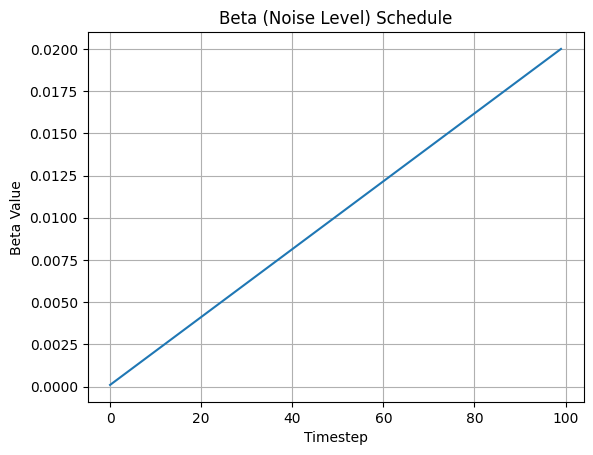

In [18]:
# Set up the noise schedule
n_steps = 100        # How many steps to go from clear image to noise
beta_start = 0.0001   # Starting noise level (small)
beta_end = 0.02       # Ending noise level (larger)

# Create schedule of gradually increasing noise levels
beta = torch.linspace(beta_start, beta_end, n_steps)

# Calculate important values used in diffusion equations
alpha = 1 - beta                  # Portion of original image to keep at each step
alpha_bar = torch.cumprod(alpha, dim=0)    # Cumulative product of alphas
sqrt_alpha_bar = torch.sqrt(alpha_bar)      # For scaling the original image
sqrt_one_minus_alpha_bar = torch.sqrt(1 - alpha_bar) # For scaling the noise

#Move the tensors to the correct device.
beta = beta.to(device)
alpha = alpha.to(device)
alpha_bar = alpha_bar.to(device)
sqrt_alpha_bar = sqrt_alpha_bar.to(device)
sqrt_one_minus_alpha_bar = sqrt_one_minus_alpha_bar.to(device)

plt.plot(beta.cpu().numpy())
plt.title("Beta (Noise Level) Schedule")
plt.xlabel("Timestep")
plt.ylabel("Beta Value")
plt.grid(True)
plt.show()


In [19]:
# Function to add noise to images (forward diffusion process)
def add_noise(x_0, t):
    """
    Add noise to images according to the forward diffusion process.

    The formula is: x_t = √(α_bar_t) * x_0 + √(1-α_bar_t) * ε
    where ε is random noise and α_bar_t is the cumulative product of (1-β).

    Args:
        x_0 (torch.Tensor): Original clean image [B, C, H, W]
        t (torch.Tensor): Timestep indices indicating noise level [B]

    Returns:
        tuple: (noisy_image, noise_added)
            - noisy_image is the image with noise added
            - noise_added is the actual noise that was added (for training)
    """
    # Create random Gaussian noise with same shape as image
    noise = torch.randn_like(x_0)

    # Get noise schedule values for the specified timesteps
    # Reshape to allow broadcasting with image dimensions
    sqrt_alpha_bar_t = sqrt_alpha_bar[t].reshape(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar[t].reshape(-1, 1, 1, 1)

    # Apply the forward diffusion equation:
    # Mixture of original image (scaled down) and noise (scaled up)
    x_t = sqrt_alpha_bar_t * x_0 + sqrt_one_minus_alpha_bar_t * noise

    return x_t, noise

In [20]:
# Function to remove noise from images (reverse diffusion process)
@torch.no_grad()  # Don't track gradients during sampling (inference only)
def remove_noise(x_t, t, model, c, c_mask):
    """
    Perform one reverse diffusion step to reduce noise from an image.

    Args:
        x_t (torch.Tensor): Noisy image at timestep t [B, C, H, W]
        t (torch.Tensor): Timestep indices [B]
        model (nn.Module): U-Net model to predict noise
        c (torch.Tensor): One-hot class conditioning [B, N_CLASSES]
        c_mask (torch.Tensor): Conditioning mask [B, 1]

    Returns:
        torch.Tensor: Denoised image for previous timestep
    """

    # 🧪 DEBUG: Check tensor types before model call
    print("🔍 x_t dtype:", x_t.dtype)
    print("🔍 t dtype:", t.dtype)
    print("🔍 c dtype:", c.dtype)
    print("🔍 c content:", c)
    print("🔍 c_mask dtype:", c_mask.dtype)

    # Predict the noise with the model
    predicted_noise = model(x_t, t, c, c_mask)

    # Get noise schedule values
    alpha_t = alpha[t].reshape(-1, 1, 1, 1)
    alpha_bar_t = alpha_bar[t].reshape(-1, 1, 1, 1)
    beta_t = beta[t].reshape(-1, 1, 1, 1)

    # If t == 0 (we're done), return current image
    if t[0].item() == 0:
        return x_t

    # Compute mean of the posterior q(x_{t-1} | x_t, x_0)
    mean = (1 / torch.sqrt(alpha_t)) * (
        x_t - (beta_t / torch.sqrt(1 - alpha_bar_t)) * predicted_noise
    )

    # Add some noise (stochasticity)
    noise = torch.randn_like(x_t)
    return mean + torch.sqrt(beta_t) * noise


In [21]:
# test function

x_dummy = torch.randn(1, 1, 28, 28).to(device)
t_dummy = torch.tensor([10], device=device)
c_dummy = torch.tensor([2], dtype=torch.long, device=device)
c_mask_dummy = torch.ones(1, 1, 1, 1).to(device)

denoised = remove_noise(x_dummy, t_dummy, model, c_dummy, c_mask_dummy)

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE



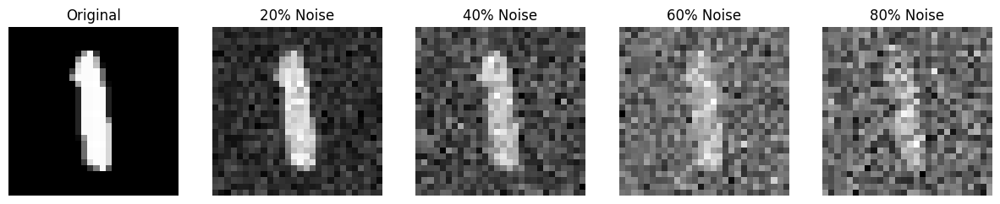

'\n# Try a non-linear noise schedule\nbeta_alt = torch.linspace(beta_start, beta_end, n_steps)**2\nalpha_alt = 1 - beta_alt\nalpha_bar_alt = torch.cumprod(alpha_alt, dim=0)\n# How would this affect the diffusion process?\n'

In [22]:
import torch
import matplotlib.pyplot as plt

# Visualization function to show how noise progressively affects images
def show_noise_progression(image, num_steps=5):
    """
    Visualize how an image gets progressively noisier in the diffusion process.

    Args:
        image (torch.Tensor): Original clean image [C, H, W]
        num_steps (int): Number of noise levels to show
    """
    plt.figure(figsize=(15, 3))

    # Show original image
    plt.subplot(1, num_steps, 1)
    if IMG_CH == 1:  # Grayscale image
        plt.imshow(image[0].cpu(), cmap='gray')
    else:  # Color image
        img = image.permute(1, 2, 0).cpu()  # Change from [C,H,W] to [H,W,C]
        if img.min() < 0:  # If normalized between -1 and 1
            img = (img + 1) / 2  # Rescale to [0,1] for display
        plt.imshow(img)
    plt.title('Original')
    plt.axis('off')

    # Show progressively noisier versions
    for i in range(1, num_steps):
        # Calculate timestep index based on percentage through the process
        t_idx = int((i/num_steps) * n_steps)
        t = torch.tensor([t_idx]).to(device)

        # Add noise corresponding to timestep t
        noisy_image, _ = add_noise(image.unsqueeze(0), t)

        # Display the noisy image
        plt.subplot(1, num_steps, i+1)
        if IMG_CH == 1:
            plt.imshow(noisy_image[0][0].cpu(), cmap='gray')
        else:
            img = noisy_image[0].permute(1, 2, 0).cpu()
            if img.min() < 0:
                img = (img + 1) / 2
            plt.imshow(img)
        plt.title(f'{int((i/num_steps) * 100)}% Noise')
        plt.axis('off')
    plt.show()

# Show an example of noise progression on a real image
sample_batch = next(iter(train_loader))  # Get first batch
sample_image = sample_batch[0][0].to(device)  # Get first image
show_noise_progression(sample_image)

# Student Activity: Try different noise schedules
# Uncomment and modify these lines to experiment:
"""
# Try a non-linear noise schedule
beta_alt = torch.linspace(beta_start, beta_end, n_steps)**2
alpha_alt = 1 - beta_alt
alpha_bar_alt = torch.cumprod(alpha_alt, dim=0)
# How would this affect the diffusion process?
"""

## Step 5: Training Our Model

Now we'll teach our AI to generate images. This process:
1. Takes a clear image
2. Adds random noise to it
3. Asks our AI to predict what noise was added
4. Helps our AI learn from its mistakes

This will take a while, but we'll see progress as it learns!

In [23]:
import torch
from torch.optim import Adam

# Create our model and move it to GPU if available
model = UNet(
    T=n_steps,              # Number of diffusion time steps
    img_ch=IMG_CH,            # Number of channels in our images (1 for grayscale, 3 for RGB)
    img_size=IMG_SIZE,        # Size of input images (28 for MNIST, 32 for CIFAR-10)
    down_chs=(32, 64, 128),   # Channel dimensions for each downsampling level
    t_embed_dim=128,          # Dimension for time step embeddings
    c_embed_dim=128           # Class embedding dimension should match last down_chs value
).to(device)


# Print model summary
print(f"\n{'='*50}")
print(f"MODEL ARCHITECTURE SUMMARY")
print(f"{'='*50}")
print(f"Input resolution: {IMG_SIZE}x{IMG_SIZE}")
print(f"Input channels: {IMG_CH}")
print(f"Time steps: {n_steps}")
print(f"Condition classes: {N_CLASSES}")
print(f"GPU acceleration: {'Yes' if device.type == 'cuda' else 'No'}")

# Validate model parameters and estimate memory requirements
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def estimate_memory(model, input_size):
    param_size = count_parameters(model) * 4 / (1024**2) # in MB
    buffer_size = 0
    for buffer in model.buffers():
        buffer_size += buffer.numel() * 4 / (1024**2)
    total_size = param_size + buffer_size
    return total_size

print(f"Total trainable parameters: {count_parameters(model):,}")
print(f"Estimated model size: {estimate_memory(model, (1, IMG_CH, IMG_SIZE, IMG_SIZE)):.2f} MB")

# Your code to verify data ranges and integrity
def check_data_ranges(dataloader):
    min_val = float('inf')
    max_val = float('-inf')
    for batch in dataloader:
        images, _ = batch
        min_val = min(min_val, images.min().item())
        max_val = max(max_val, images.max().item())
    return min_val, max_val

print(f"Training data range: {check_data_ranges(train_loader)}")
print(f"Validation data range: {check_data_ranges(val_loader)}")

# Set up the optimizer with parameters tuned for diffusion models
# Note: Lower learning rates tend to work better for diffusion models
initial_lr = 1e-4  # Starting learning rate
weight_decay = 1e-5  # L2 regularization to prevent overfitting

optimizer = Adam(
    model.parameters(),
    lr=initial_lr,
    weight_decay=weight_decay
)

# Learning rate scheduler to reduce LR when validation loss plateaus
# This helps fine-tune the model toward the end of training
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',          # Reduce LR when monitored value stops decreasing
    factor=0.5,          # Multiply LR by this factor
    patience=5,          # Number of epochs with no improvement after which LR will be reduced
    verbose=True,        # Print message when LR is reduced
    min_lr=1e-6          # Lower bound on the learning rate
)

# STUDENT EXPERIMENT:
# Try different channel configurations and see how they affect:
# 1. Model size (parameter count)
# 2. Training time
# 3. Generated image quality
#
# Suggestions:
# - Smaller: down_chs=(16, 32, 64)
# - Larger: down_chs=(64, 128, 256, 512)

✅ Created UNet with 3 scale levels
Channel dimensions: (32, 64, 128)

MODEL ARCHITECTURE SUMMARY
Input resolution: 28x28
Input channels: 1
Time steps: 100
Condition classes: 10
GPU acceleration: Yes
Total trainable parameters: 1,079,105
Estimated model size: 4.12 MB
Training data range: (-1.0, 1.0)
Validation data range: (-1.0, 1.0)


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [24]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import os

# Helper to count parameters and estimate model memory
def validate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    param_memory = total_params * 4 / (1024 ** 2)  # MB
    grad_memory = trainable_params * 4 / (1024 ** 2)
    buffer_memory = param_memory * 2  # Rough buffer/activation estimate
    print(f"Estimated GPU memory usage: {param_memory + grad_memory + buffer_memory:.1f} MB")

# Check image data range integrity
def verify_data_range(dataloader, name="Dataset"):
    batch = next(iter(dataloader))[0]
    print(f"\n{name} range check:")
    print(f"Shape: {batch.shape}")
    print(f"Data type: {batch.dtype}")
    print(f"Min value: {batch.min().item():.2f}")
    print(f"Max value: {batch.max().item():.2f}")
    print(f"Contains NaN: {torch.isnan(batch).any().item()}")
    print(f"Contains Inf: {torch.isinf(batch).any().item()}")


In [25]:
# Generates digits 0–9 using the trained model
from torchvision.utils import make_grid

def generate_samples(model, n_samples=10):
    model.eval()
    with torch.no_grad():
        samples = []

        for digit in range(min(n_samples, 10)):
            x = torch.randn(1, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

            # Proper class label as LongTensor (no one-hot)
            c = torch.tensor([digit], dtype=torch.long).to(device)
            c_mask = torch.ones(1, 1, 1, 1, dtype=torch.float).to(device)

            for t in range(n_steps - 1, -1, -1):
                t_batch = torch.full((1,), t, device=device)
                x = remove_noise(x, t_batch, model, c, c_mask)

            samples.append(x)

        samples = torch.cat(samples, dim=0)
        grid = make_grid(samples, nrow=min(n_samples, 5), normalize=True)

        plt.figure(figsize=(10, 4))
        if IMG_CH == 1:
            plt.imshow(grid.permute(1, 2, 0).cpu().squeeze(), cmap='gray')
        else:
            plt.imshow(grid.permute(1, 2, 0).cpu())
        plt.axis('off')
        plt.title('Generated Digits 0–9')
        plt.show()


In [26]:
# Safe model saving with backup
def safe_save_model(model, path, optimizer=None, epoch=None, best_loss=None):
    try:
        save_dict = {'model_state_dict': model.state_dict()}
        if optimizer: save_dict['optimizer_state_dict'] = optimizer.state_dict()
        if epoch is not None: save_dict['epoch'] = epoch
        if best_loss is not None: save_dict['best_loss'] = best_loss

        if os.path.exists(path):
            os.replace(path, path + '.backup')
            print(f"Created backup at {path + '.backup'}")

        torch.save(save_dict, path)
        print(f"✅ Model saved to: {path}")

    except Exception as e:
        print(f"❌ Error saving model: {e}")
        try:
            emergency_path = path + '.emergency'
            torch.save(model.state_dict(), emergency_path)
            print(f"⚠️ Emergency save: {emergency_path}")
        except:
            print("💥 Emergency save failed.")


In [27]:
# Implementation of the training step function
def train_step(x, c):
    try:
        c = c.to(device)  # class indices [64]
        c_mask = torch.ones_like(c.unsqueeze(-1)).to(device)

        t = torch.randint(0, n_steps, (x.shape[0],)).to(device)
        x_t, actual_noise = add_noise(x, t)

        # Print statements for debugging
        print(f"train_step - x shape: {x.shape}")
        print(f"train_step - c shape: {c.shape}")
        print(f"train_step - c_mask shape: {c_mask.shape}")
        print(f"train_step - t shape: {t.shape}")
        print(f"train_step - x_t shape: {x_t.shape}")
        print(f"train_step - actual_noise shape: {actual_noise.shape}")

        # Reshape c_mask to match later operations
        c_mask = c_mask.unsqueeze(-1).unsqueeze(-1)  # [64, 1, 1, 1]

        predicted_noise = model(x_t, t, c, c_mask)

        loss = F.mse_loss(predicted_noise, actual_noise)
        return loss

    except Exception as e:
        print(f"Exception in train_step: {e}")
        raise e


In [28]:
loss = train_step(x_test, c_test)
print("Loss:", loss.item())

train_step - x shape: torch.Size([64, 1, 28, 28])
train_step - c shape: torch.Size([64])
train_step - c_mask shape: torch.Size([64, 1])
train_step - t shape: torch.Size([64])
train_step - x_t shape: torch.Size([64, 1, 28, 28])
train_step - actual_noise shape: torch.Size([64, 1, 28, 28])
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

Loss: 0.9996849298477173


In [29]:
# Grab one mini-batch from the training data
test_batch = next(iter(train_loader))
x_test, c_test = test_batch[0].to(device), test_batch[1].to(device)

# Run a single training step
loss = train_step(x_test, c_test)

# Print the result
print(f"\n✅ train_step test successful! Loss: {loss.item():.4f}")


train_step - x shape: torch.Size([64, 1, 28, 28])
train_step - c shape: torch.Size([64])
train_step - c_mask shape: torch.Size([64, 1])
train_step - t shape: torch.Size([64])
train_step - x_t shape: torch.Size([64, 1, 28, 28])
train_step - actual_noise shape: torch.Size([64, 1, 28, 28])
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE


✅ train_step test successful! Loss: 1.0037


In [30]:
# Mini train loop

EPOCHS = 5

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0

    for batch in train_loader:
        x_batch, c_batch = batch[0].to(device), batch[1].to(device)
        loss = train_step(x_batch, c_batch)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"📉 Epoch {epoch+1}/{EPOCHS} - Avg Loss: {avg_loss:.4f}")


Streaming output truncated to the last 5000 lines.
✅ FORWARD COMPLETE

train_step - x shape: torch.Size([64, 1, 28, 28])
train_step - c shape: torch.Size([64])
train_step - c_mask shape: torch.Size([64, 1])
train_step - t shape: torch.Size([64])
train_step - x_t shape: torch.Size([64, 1, 28, 28])
train_step - actual_noise shape: torch.Size([64, 1, 28, 28])
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

train_step - x shape: torch.Size([64, 1, 28, 28])
train_step - c shape: torch.Size([64])
train_step - c_mask shape: torch.Size([64, 1])
train_step - t shape: torch.Size([64])
train_step - x_t shape: 

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

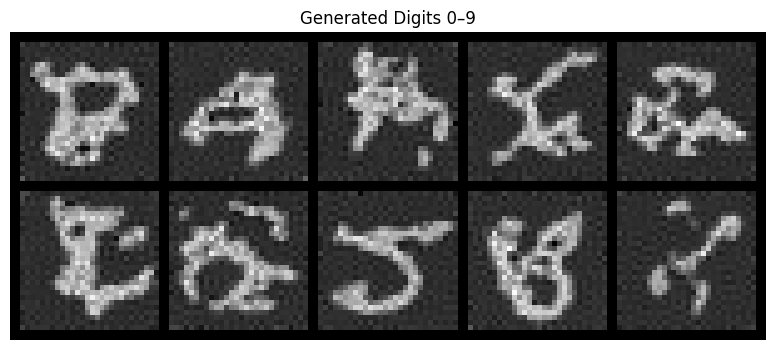

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

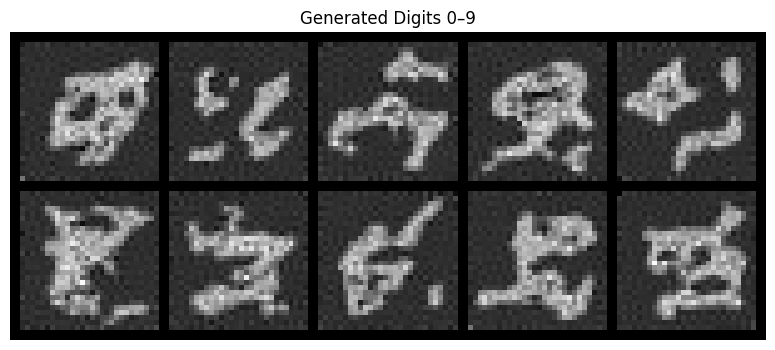

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

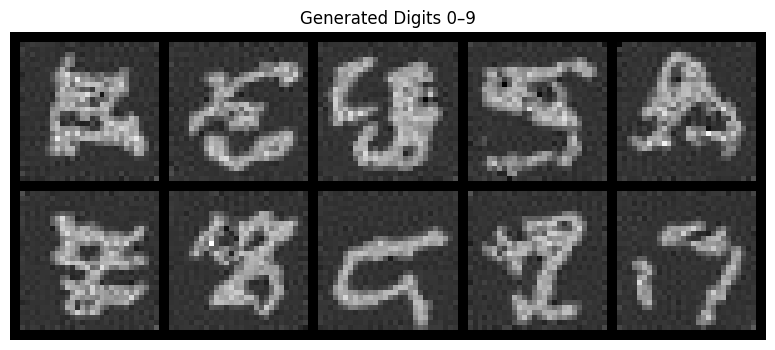

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

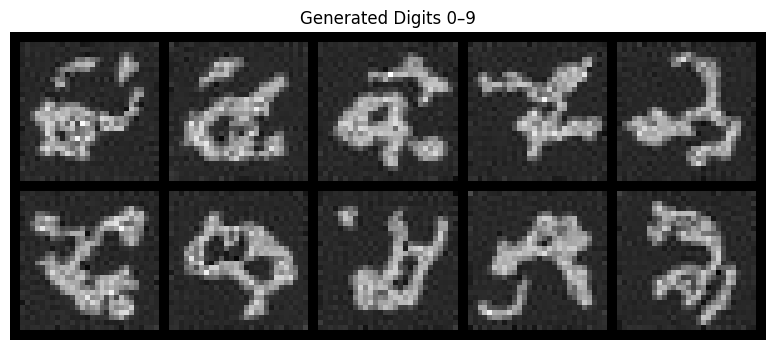

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

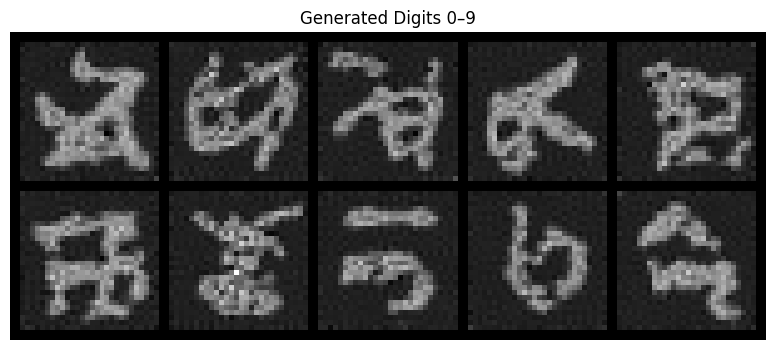

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

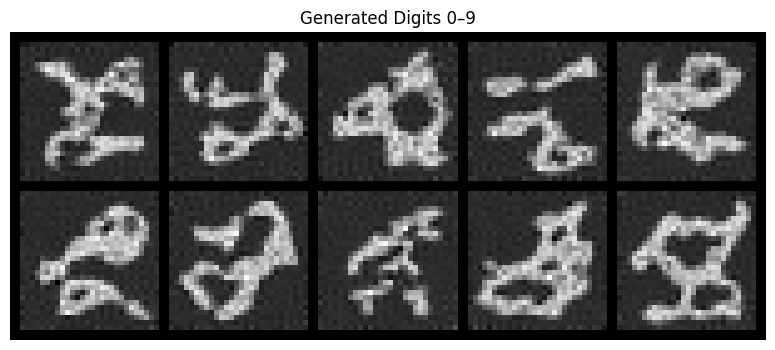

📉 Avg Epoch 5 Loss: 0.1328
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input:

In [31]:
from torch.utils.data import random_split

# Re-split the dataset if needed
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size], generator=generator)

# Loaders
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Training config
early_stopping_patience = 10
gradient_clip_value = 0.5
display_frequency = 100
generate_frequency = 500

# Tracking
best_loss = float('inf')
train_losses = []
val_losses = []
no_improve_epochs = 0
global_step = 0

print("\n" + "="*50)
print("STARTING TRAINING")
print("="*50)
model.train()

for epoch in range(EPOCHS):
    print(f"\n🔥 Epoch {epoch+1}/{EPOCHS}")
    epoch_loss = 0

    for batch_idx, (x, c) in enumerate(train_dataloader):
        x, c = x.to(device), c.to(device)

        optimizer.zero_grad()
        loss = train_step(x, c)

        # 🚫 Skip if loss is NaN or Inf
        if not torch.isfinite(loss):
            print(f"❌ Non-finite loss at step {global_step}, skipping batch...")
            continue

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip_value)
        optimizer.step()

        epoch_loss += loss.item()
        global_step += 1

        if global_step % display_frequency == 0:
            print(f"📍 Step {global_step} | Batch {batch_idx} | Loss: {loss.item():.4f}")

        if global_step % generate_frequency == 0:
            print("✨ Generating samples...")
            generate_samples(model, n_samples=10)

    avg_epoch_loss = epoch_loss / len(train_dataloader)
    train_losses.append(avg_epoch_loss)
    print(f"📉 Avg Epoch {epoch+1} Loss: {avg_epoch_loss:.4f}")

    # 🔍 Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for x_val, c_val in val_dataloader:
            x_val, c_val = x_val.to(device), c_val.to(device)
            t_val = torch.randint(0, n_steps, (x_val.shape[0],)).to(device)
            x_t_val, actual_noise_val = add_noise(x_val, t_val)
            c_mask_val = torch.ones_like(c_val.unsqueeze(-1)).unsqueeze(-1).unsqueeze(-1).to(device)
            pred_val = model(x_t_val, t_val, c_val, c_mask_val)
            loss_val = F.mse_loss(pred_val, actual_noise_val)
            val_loss += loss_val.item()

    val_loss /= len(val_dataloader)
    val_losses.append(val_loss)
    print(f"🧪 Validation Loss: {val_loss:.4f}")
    model.train()

    # 💾 Save model if improved
    if val_loss < best_loss:
        best_loss = val_loss
        no_improve_epochs = 0
        safe_save_model(model, "best_model.pth", optimizer=optimizer, epoch=epoch+1, best_loss=best_loss)
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stopping_patience:
            print("⏹️ Early stopping triggered.")
            break


Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

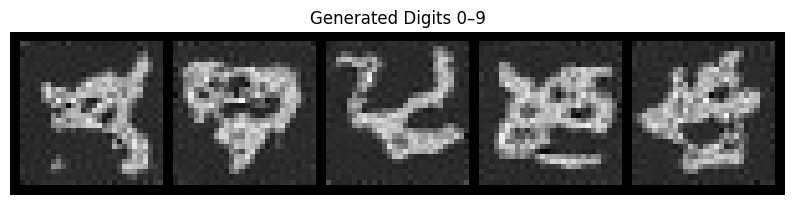

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

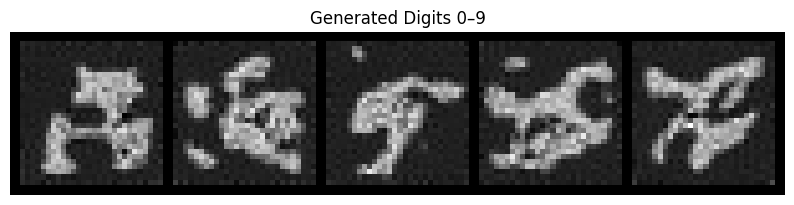

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

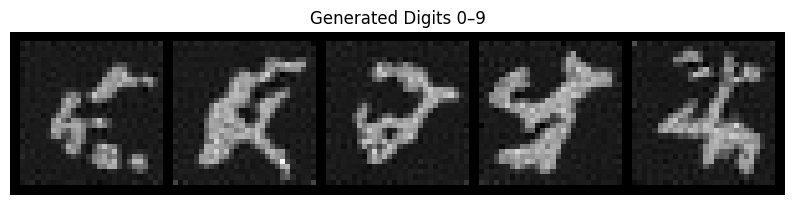

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

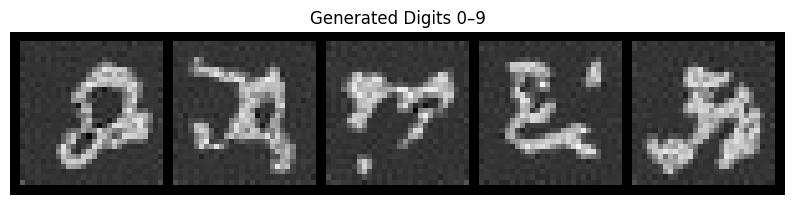

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

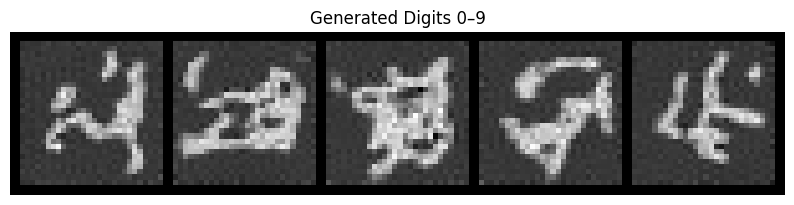

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

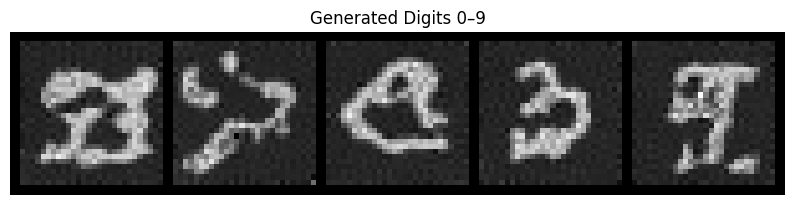

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

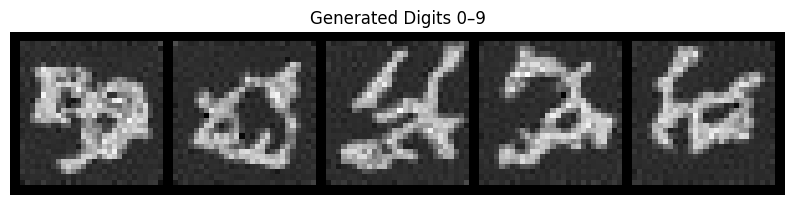

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

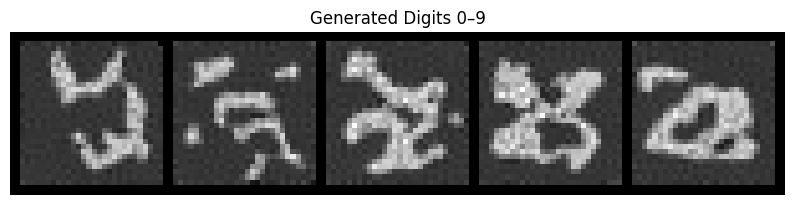

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

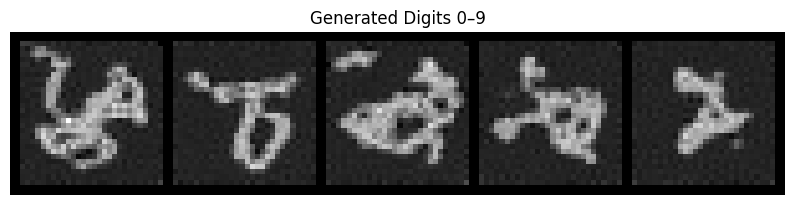

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

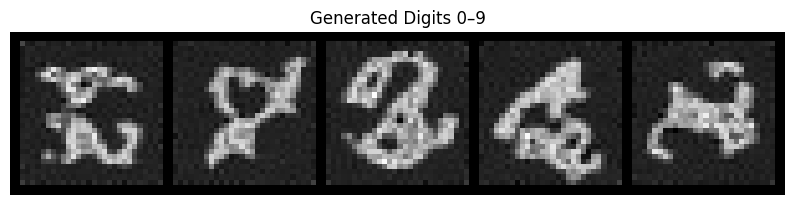

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

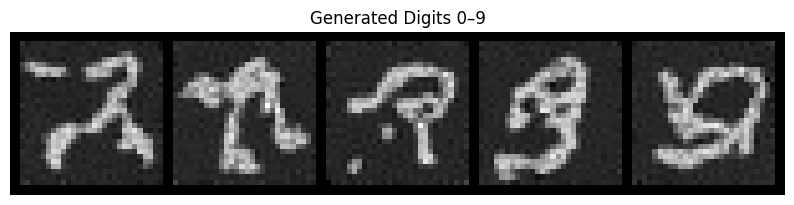

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

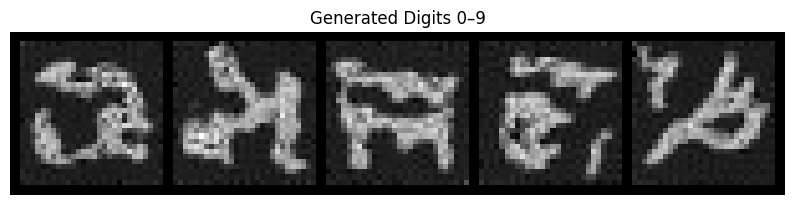

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

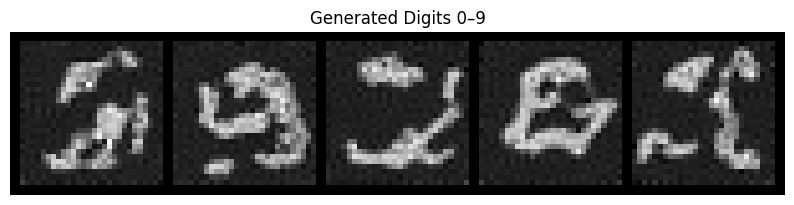

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

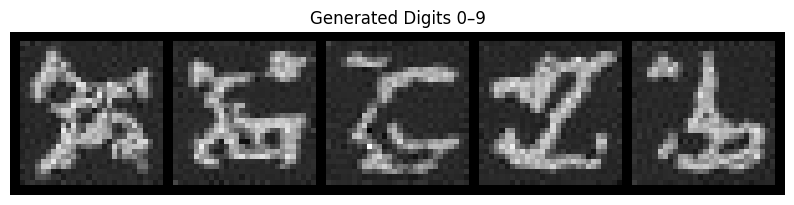

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

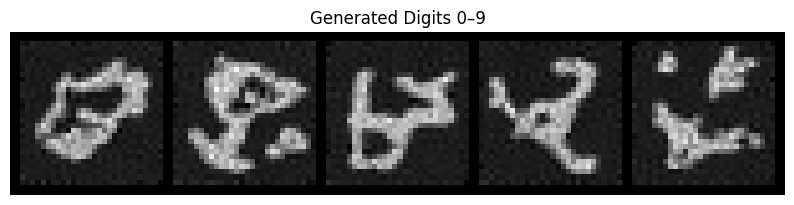

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

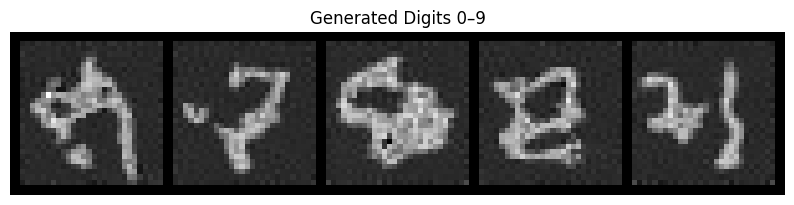

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

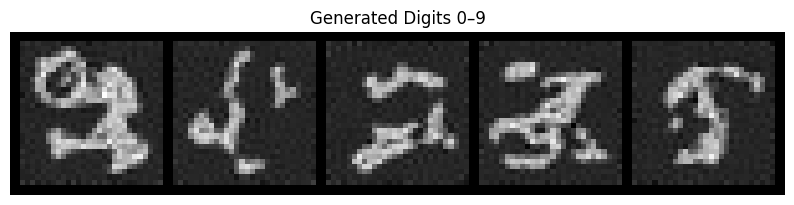

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

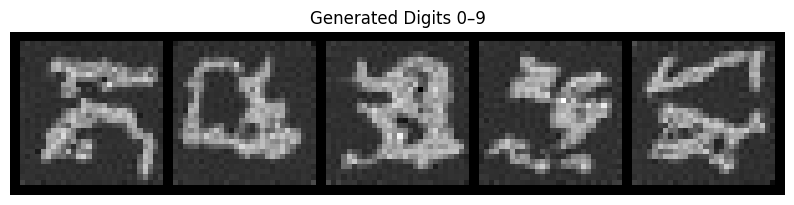

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

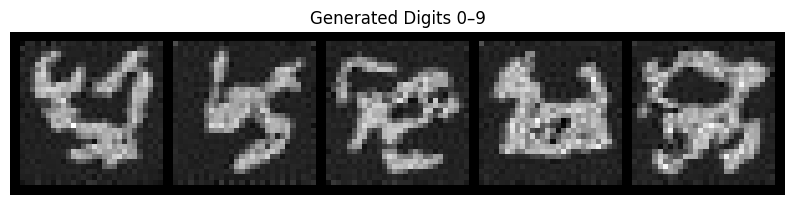

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

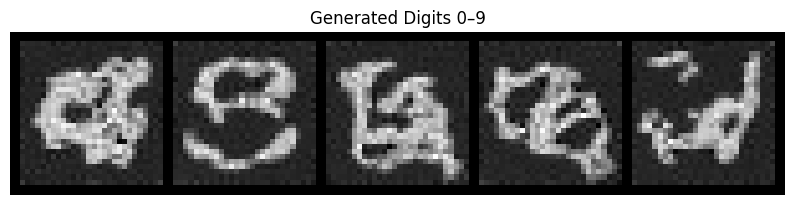

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

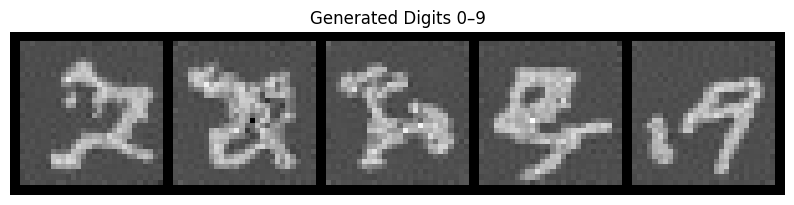

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

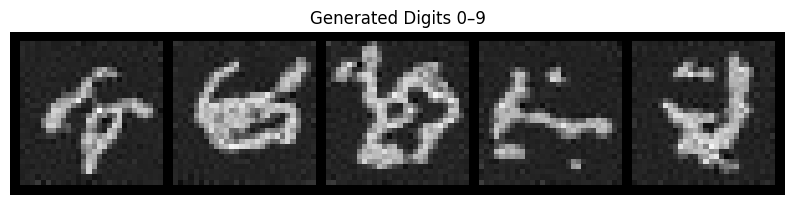

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

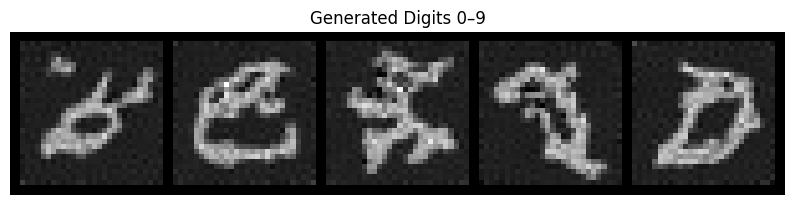

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

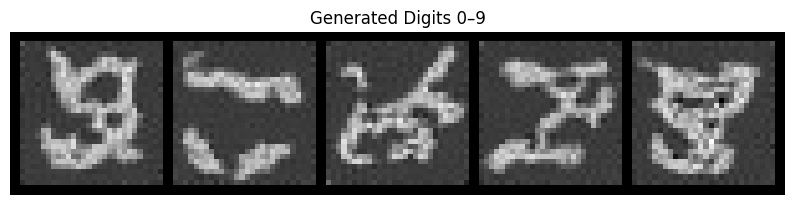

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

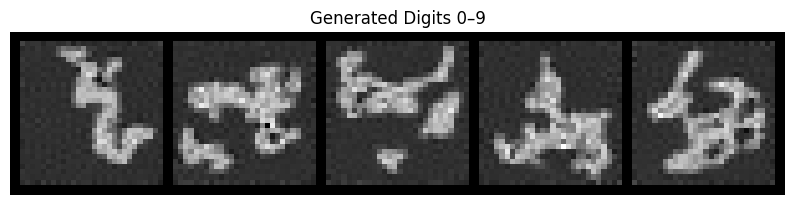

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

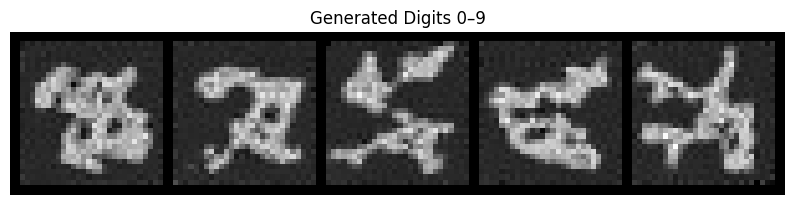

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

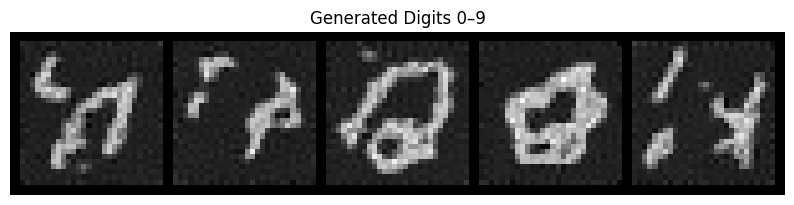

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

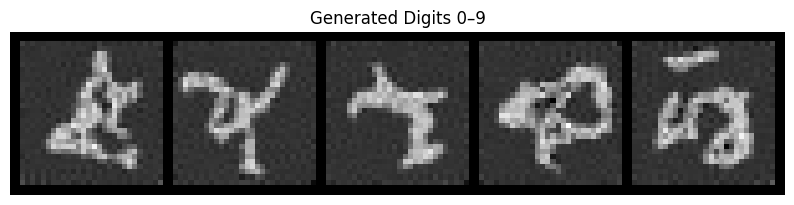

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

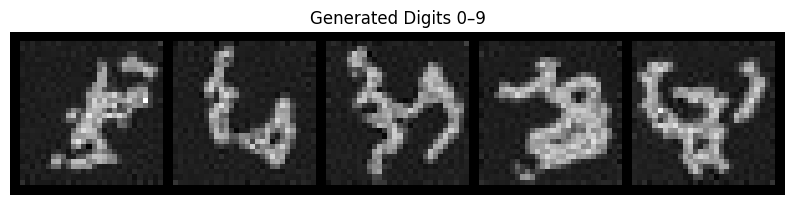

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

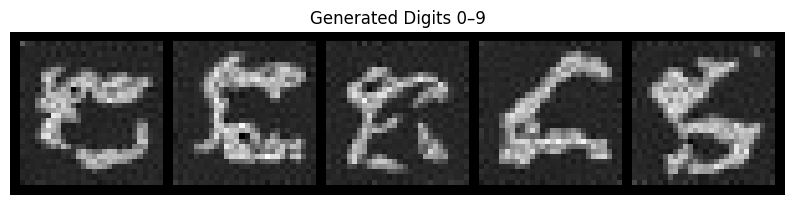

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

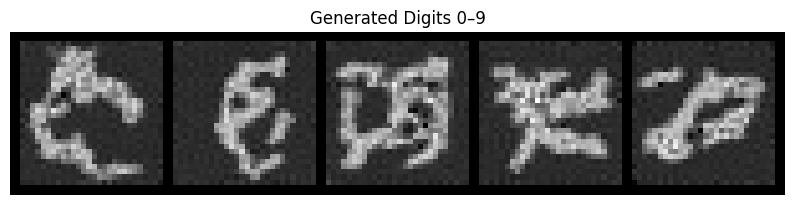

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

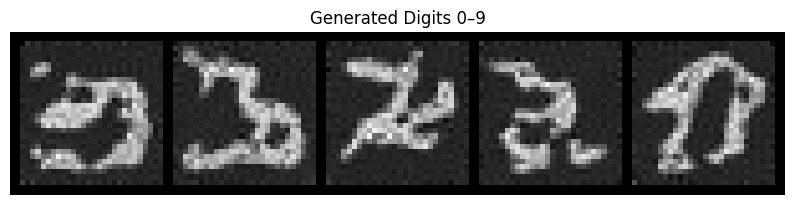

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

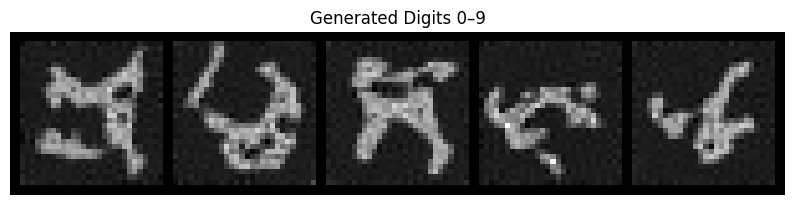

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

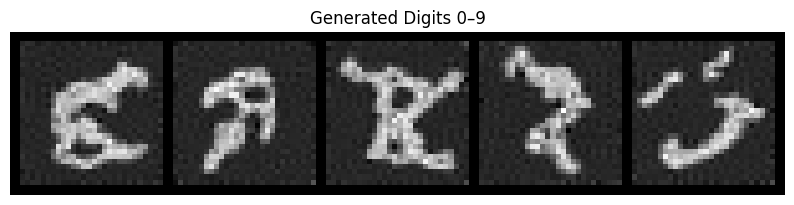

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

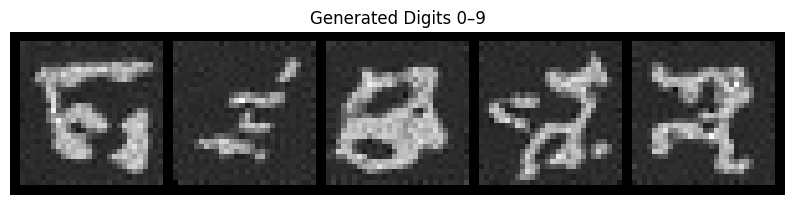

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

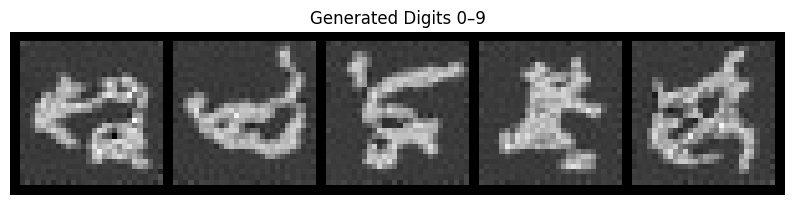

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

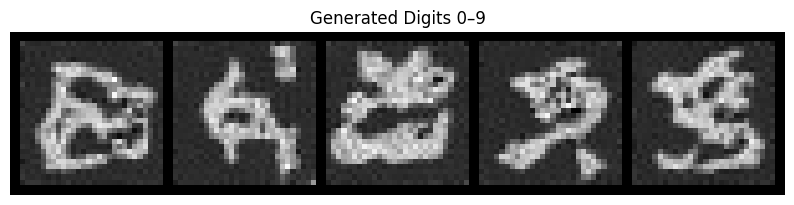

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

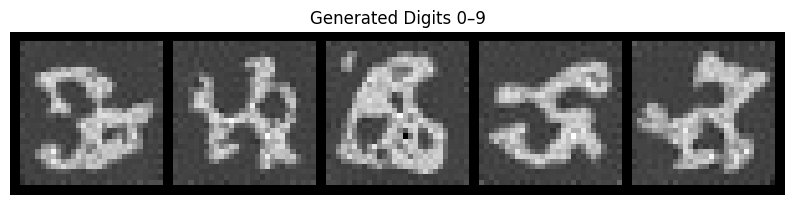

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

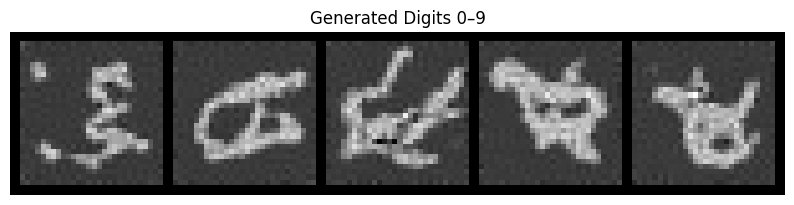

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

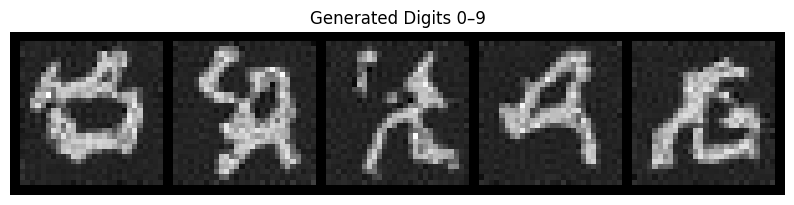

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

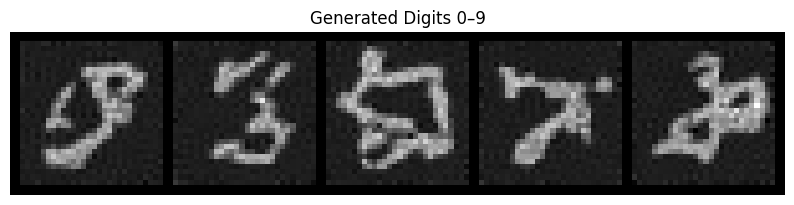

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

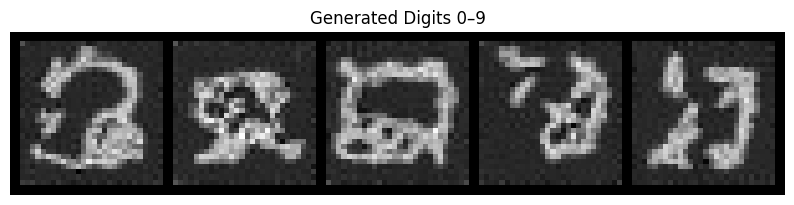

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

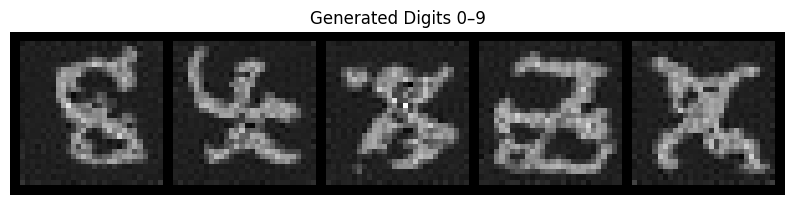

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

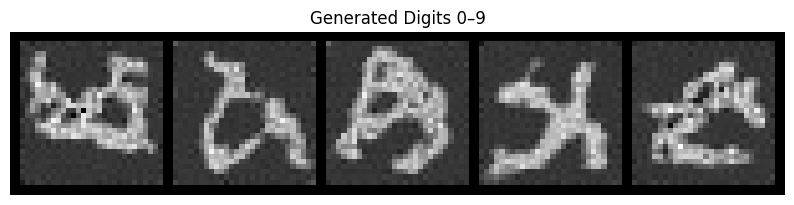

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

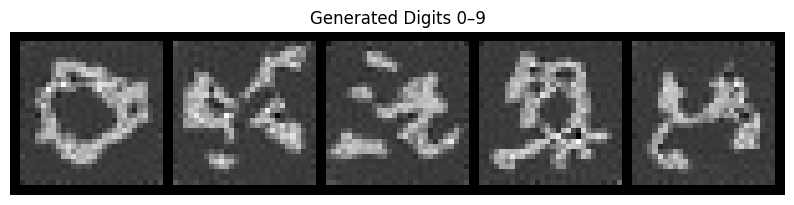

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

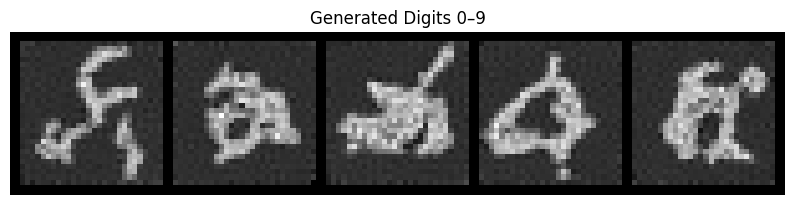

train_step - x shape: torch.Size([64, 1, 28, 28])
train_step - c shape: torch.Size([64])
train_step - c_mask shape: torch.Size([64, 1])
train_step - t shape: torch.Size([64])
train_step - x_t shape: torch.Size([64, 1, 28, 28])
train_step - actual_noise shape: torch.Size([64, 1, 28, 28])
🚀 FORWARD STARTED
x input: torch.Size([64, 1, 28, 28])
t input: torch.Size([64])
c input: torch.Size([64])
c_mask input: torch.Size([64, 1, 1, 1])
📦 Raw t_embed: torch.Size([64, 128])
📦 Raw c_embed: torch.Size([64, 128])
📐 Expanded t_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_embed: torch.Size([64, 128, 7, 7])
📐 Expanded c_mask: torch.Size([64, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([64, 128, 7, 7])
✅ FORWARD COMPLETE

Current step: 46
  Generating samples...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c inp

KeyboardInterrupt: 

In [32]:
# Wrap the training loop in a try-except block for better error handling:
# Your code for the training loop
# Hint: Use a try-except block for better error handling
# Process each epoch and each batch, with validation after each epoch
""""
try:
    EPOCHS = 10  # or whatever number of epochs you want.

    for epoch in range(EPOCHS):
        print(f"\nEpoch {epoch+1}/{EPOCHS}")
        print("-" * 20)

        # Training phase
        model.train()
        epoch_losses = []

        # Process each batch
        for step, (images, labels) in enumerate(train_dataloader):
            try:  # Add try-except block here
                images = images.to(device)
                labels = labels.to(device)

                # Training step
                optimizer.zero_grad()
                loss = train_step(images, labels)
                # Check if loss is valid
                if not torch.isfinite(loss):
                    print(f"❌ Non-finite loss at step {global_step}, skipping batch...")
                    continue


                loss.backward()

                # Add gradient clipping for stability
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip_value)

                optimizer.step()
                epoch_losses.append(loss.item())

                # Show progress at regular intervals
                if step % display_frequency == 0:
                    print(f"  Step {step}/{len(train_dataloader)}, Loss: {loss.item():.4f}")

                # Generate samples less frequently to save time
                print(f"Current step: {step}")  # Added print statement for debugging

                if True:  # Was if step % generate_frequency == 0 and step > 0:
                    print("  Generating samples...")
                    generate_samples(model, n_samples=5)

            except Exception as e:
                print(f"Exception in batch processing: {e}")  # Print any exceptions

        # End of epoch - calculate average training loss
        avg_train_loss = sum(epoch_losses) / len(epoch_losses)
        train_losses.append(avg_train_loss)
        print(f"\nTraining - Epoch {epoch+1} average loss: {avg_train_loss:.4f}")

        # ... (rest of your epoch-level code) ...

except Exception as e:
    print(f"An error occurred during training: {e}")

Streaming output truncated to the last 5000 lines.
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1,

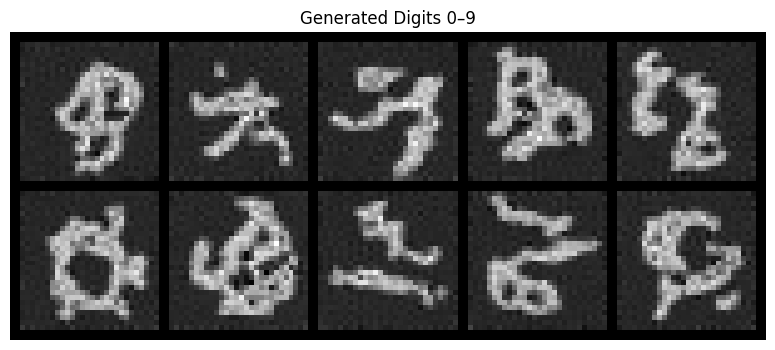

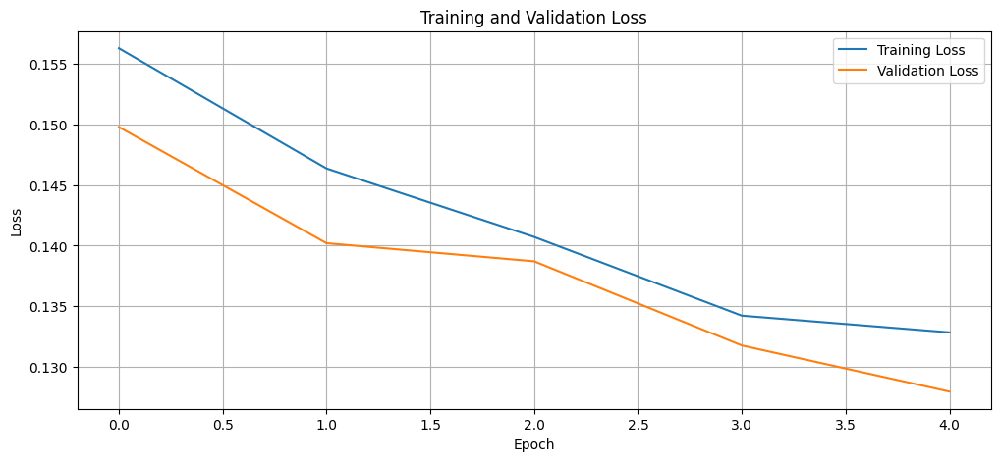

In [33]:
# Final wrap-up
print("\n" + "="*50)
print("TRAINING COMPLETE")
print("="*50)
print(f"Best validation loss: {best_loss:.4f}")

# Generate final samples
print("Generating final samples...")
generate_samples(model, n_samples=10)

# Display final loss curves
plt.figure(figsize=(12, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# Clean up memory
torch.cuda.empty_cache()

In [34]:
try:
    # Your entire training loop here
    for epoch in range(n_epochs):
        for step, (images, labels) in enumerate(train_dataloader):
            # ... your training code ...
            if step % generate_frequency == 0 and step > 0:
                generate_samples(model, n_samples=5)
except Exception as e:
    print(f"An exception occurred during training: {e}")

An exception occurred during training: name 'n_epochs' is not defined


In [35]:
def forward(self, x, t, c, c_mask):
    # Time embedding
    t_embed = self.time_embed(t)
    print(f"Shape of t_embed: {t_embed.shape}")

    # Class embedding
    c_embed = self.class_embed(c)
    print(f"Shape of c_embed: {c_embed.shape}")

    # Initial feature extraction
    x = self.init_conv(x)

    # Downsampling path and skip connections
    skips = []
    for down_block in self.down_blocks:
        skips.append(x)
        x = down_block(x)

    # Middle processing and conditioning
    x = self.middle_blocks(x)

    print(f"Shape of c_mask: {c_mask.shape}")
    print(f"Shape of x before addition: {x.shape}")

    x = x + t_embed[:, :, None, None] + c_embed * c_mask[:, :, None, None]

    # Upsampling path with skip connections
    for up_block in self.up_blocks:
        skip = skips.pop()
        x = up_block(x, skip)

    # Final projection
    x = self.final_conv(x)
    return x

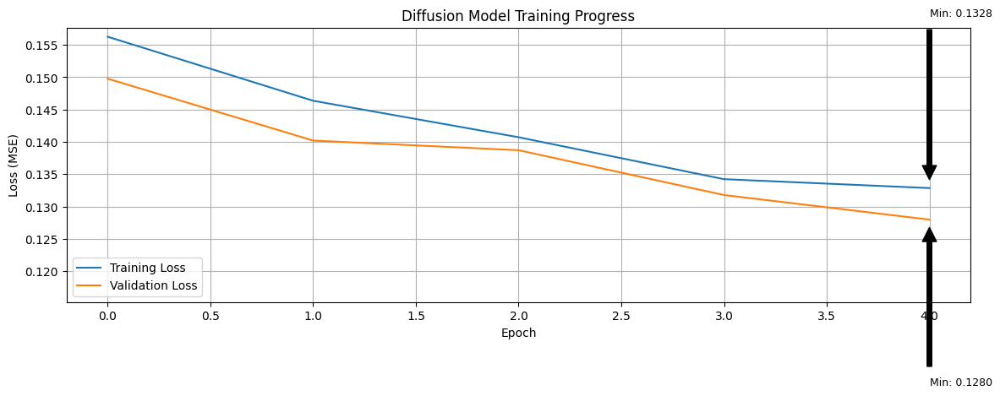


Training Statistics:
------------------------------
Starting training loss:    0.1563
Final training loss:       0.1328
Best training loss:        0.1328
Training loss improvement: 15.0%

Validation Statistics:
------------------------------
Starting validation loss: 0.1498
Final validation loss:    0.1280
Best validation loss:     0.1280


In [36]:
# Plot training progress
plt.figure(figsize=(12, 5))

# Plot training and validation losses for comparison
plt.plot(train_losses, label='Training Loss')
if len(val_losses) > 0:  # Only plot validation if it exists
    plt.plot(val_losses, label='Validation Loss')

# Improve the plot with better labels and styling
plt.title('Diffusion Model Training Progress')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)

# Add annotations for key points
if len(train_losses) > 1:
    min_train_idx = train_losses.index(min(train_losses))
    plt.annotate(f'Min: {min(train_losses):.4f}',
                 xy=(min_train_idx, min(train_losses)),
                 xytext=(min_train_idx, min(train_losses)*1.2),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=9)

# Add validation min point if available
if len(val_losses) > 1:
    min_val_idx = val_losses.index(min(val_losses))
    plt.annotate(f'Min: {min(val_losses):.4f}',
                xy=(min_val_idx, min(val_losses)),
                xytext=(min_val_idx, min(val_losses)*0.8),
                arrowprops=dict(facecolor='black', shrink=0.05),
                fontsize=9)

# Set y-axis to start from 0 or slightly lower than min value
plt.ylim(bottom=max(0, min(min(train_losses) if train_losses else float('inf'),
                          min(val_losses) if val_losses else float('inf'))*0.9))

plt.tight_layout()
plt.show()

# Add statistics summary for students to analyze
print("\nTraining Statistics:")
print("-" * 30)
if train_losses:
    print(f"Starting training loss:    {train_losses[0]:.4f}")
    print(f"Final training loss:       {train_losses[-1]:.4f}")
    print(f"Best training loss:        {min(train_losses):.4f}")
    print(f"Training loss improvement: {((train_losses[0] - min(train_losses)) / train_losses[0] * 100):.1f}%")

if val_losses:
    print("\nValidation Statistics:")
    print("-" * 30)
    print(f"Starting validation loss: {val_losses[0]:.4f}")
    print(f"Final validation loss:    {val_losses[-1]:.4f}")
    print(f"Best validation loss:     {min(val_losses):.4f}")

# STUDENT EXERCISE:
# 1. Try modifying this plot to show a smoothed version of the losses
# 2. Create a second plot showing the ratio of validation to training loss
#    (which can indicate overfitting when the ratio increases)

## Step 6: Generating New Images

Now that our model is trained, let's generate some new images! We can:
1. Generate specific numbers
2. Generate multiple versions of each number
3. See how the generation process works step by step

Streaming output truncated to the last 5000 lines.
🔍 c dtype: torch.int64
🔍 c content: tensor([7, 7, 7, 7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7, 7, 7, 7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7

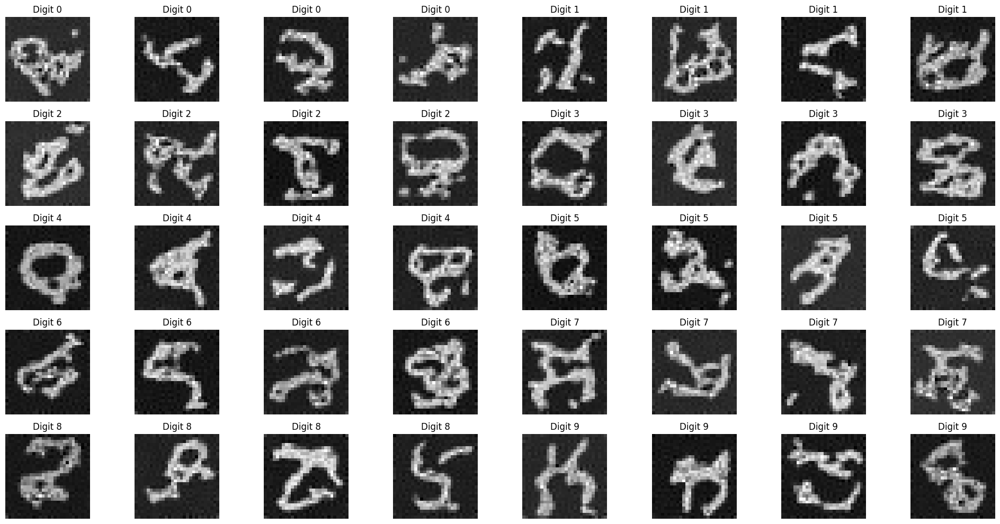

Streaming output truncated to the last 5000 lines.
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_em

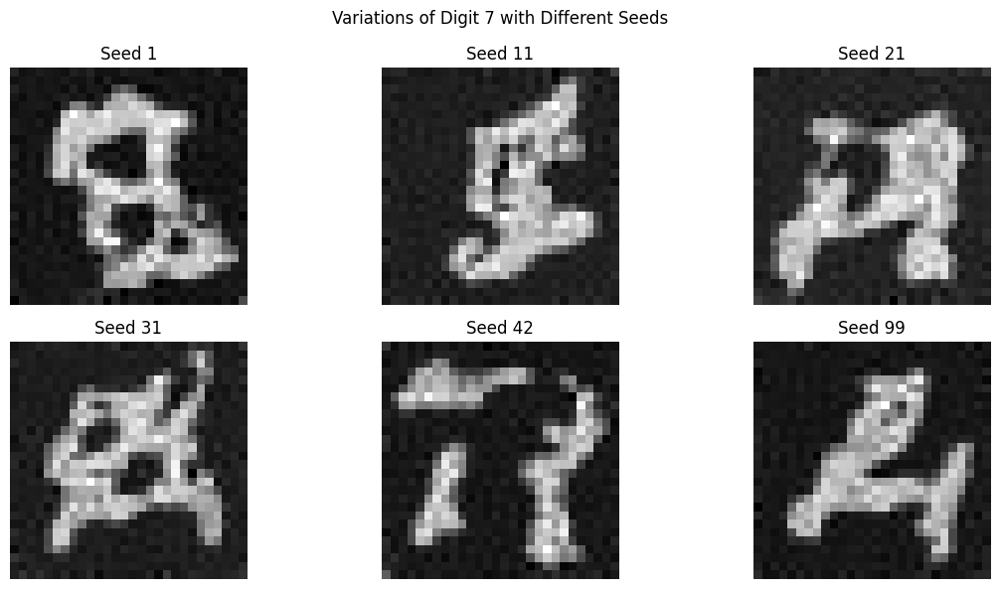

In [40]:
# ✅ Function to generate digits using class indices
def generate_number(model, number, n_samples=4):
    """
    Generate multiple versions of a specific number using the diffusion model.

    Args:
        model (nn.Module): The trained diffusion model
        number (int): The digit to generate (0–9)
        n_samples (int): Number of variations to generate

    Returns:
        torch.Tensor: Generated images of shape [n_samples, IMG_CH, IMG_SIZE, IMG_SIZE]
    """
    model.eval()
    with torch.no_grad():
        # Start with random noise
        samples = torch.randn(n_samples, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

        # Class labels as indices (not one-hot)
        c = torch.full((n_samples,), number, dtype=torch.long).to(device)
        c_mask = torch.ones(n_samples, 1, 1, 1).to(device)

        print(f"Generating {n_samples} versions of digit '{number}'...")

        for t in range(n_steps - 1, -1, -1):
            t_batch = torch.full((n_samples,), t, device=device)
            samples = remove_noise(samples, t_batch, model, c, c_mask)

            if t % (n_steps // 5) == 0:
                print(f"  Denoising step {n_steps - 1 - t}/{n_steps - 1}")

        return samples

# ✅ Generate 4 versions of each digit (0–9)
plt.figure(figsize=(20, 10))
for i in range(10):
    samples = generate_number(model, i, n_samples=4)
    for j in range(4):
        index = i * 4 + j + 1
        plt.subplot(5, 8, index)
        if IMG_CH == 1:
            plt.imshow(samples[j][0].cpu(), cmap='gray')
        else:
            img = samples[j].permute(1, 2, 0).cpu()
            img = (img + 1) / 2 if img.min() < 0 else img
            plt.imshow(img)
        plt.title(f'Digit {i}')
        plt.axis('off')
plt.tight_layout()
plt.show()

# ✅ Student Activity – Generate the same digit with different seeds
print("\nSTUDENT ACTIVITY: Generating the same digit with different noise seeds")

digit = 7  # Try changing this to see other numbers
seeds = [1, 11, 21, 31, 42, 99]

plt.figure(figsize=(12, 6))
for i, seed in enumerate(seeds):
    torch.manual_seed(seed)
    sample = generate_number(model, digit, n_samples=1)[0]

    plt.subplot(2, 3, i + 1)
    plt.imshow(sample[0].cpu(), cmap='gray')
    plt.title(f"Seed {seed}")
    plt.axis('off')

plt.suptitle(f"Variations of Digit {digit} with Different Seeds")
plt.tight_layout()
plt.show()


## Step 7: Watching the Generation Process

Let's see how our model turns random noise into clear images, step by step. This helps us understand how the diffusion process works!

In [46]:
def visualize_generation_steps(model, number, n_preview_steps=10):
    """
    Show how an image evolves from noise to a clear number.
    """
    model.eval()
    with torch.no_grad():
        # Start with random noise
        x = torch.randn(1, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

        # Set up which number to generate
        c = torch.tensor([number], dtype=torch.long).to(device)
        c_mask = torch.ones(1, 1, 1, 1).to(device)

        # Capture which timesteps to visualize
        step_indices = set([int(s.item()) for s in torch.linspace(n_steps - 1, 0, n_preview_steps)])

        # Store images
        images = [x[0].cpu()]

        for t in range(n_steps - 1, -1, -1):
            t_batch = torch.full((1,), t, device=device)
            x = remove_noise(x, t_batch, model, c, c_mask)

            if t in step_indices:
                images.append(x[0].cpu())

        # Plot progression
        plt.figure(figsize=(20, 3))
        for i, img in enumerate(images):
            plt.subplot(1, len(images), i + 1)
            if IMG_CH == 1:
                plt.imshow(img[0], cmap='gray')
            else:
                img = img.permute(1, 2, 0)
                if img.min() < 0:
                    img = (img + 1) / 2
                plt.imshow(img)
            step = "start" if i == 0 else list(step_indices)[i - 1]
            plt.title(f'Step {step}')
            plt.axis('off')
        plt.tight_layout()
        plt.show()



🌀 Generating number 0:
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128,

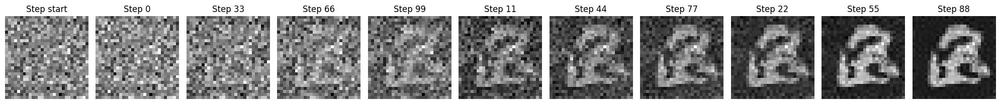


🌀 Generating number 3:
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([3], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([3], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128,

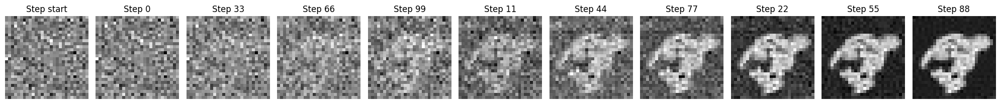


🌀 Generating number 7:
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_embed: torch.Size([1, 128, 7, 7])
📐 Expanded c_mask: torch.Size([1, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([1, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([1, 1, 28, 28])
t input: torch.Size([1])
c input: torch.Size([1])
c_mask input: torch.Size([1, 1, 1, 1])
📦 Raw t_embed: torch.Size([1, 128])
📦 Raw c_embed: torch.Size([1, 128])
📐 Expanded t_embed: torch.Size([1, 128,

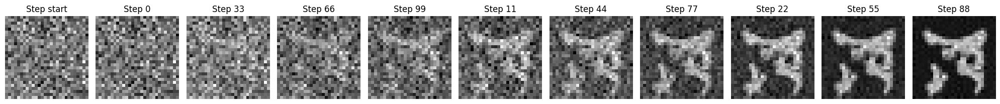

In [47]:
for number in [0, 3, 7]:
    print(f"\n🌀 Generating number {number}:")
    visualize_generation_steps(model, number)


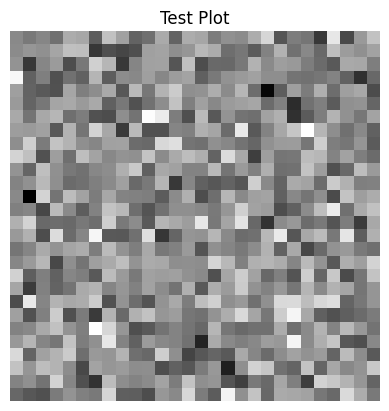

In [45]:
import matplotlib.pyplot as plt
import torch

plt.imshow(torch.randn(28, 28), cmap='gray')
plt.title("Test Plot")
plt.axis('off')
plt.show()


## Step 8: Adding CLIP Evaluation

[CLIP](https://openai.com/research/clip) is a powerful AI model that can understand both images and text. We'll use it to:
1. Evaluate how realistic our generated images are
2. Score how well they match their intended numbers
3. Help guide the generation process towards better quality

In [39]:
## Step 8: Adding CLIP Evaluation

# CLIP (Contrastive Language-Image Pre-training) is a powerful model by OpenAI that connects text and images.
# We'll use it to evaluate how recognizable our generated digits are by measuring how strongly
# the CLIP model associates our generated images with text descriptions like "an image of the digit 7".

# First, we need to install CLIP and its dependencies
print("Setting up CLIP (Contrastive Language-Image Pre-training) model...")

# Track installation status
clip_available = False

try:
    # Install dependencies first - these help CLIP process text and images
    print("Installing CLIP dependencies...")
    !pip install -q ftfy regex tqdm

    # Install CLIP from GitHub
    print("Installing CLIP from GitHub repository...")
    !pip install -q git+https://github.com/openai/CLIP.git

    # Import and verify CLIP is working
    print("Importing CLIP...")
    import clip

    # Test that CLIP is functioning
    models = clip.available_models()
    print(f"✓ CLIP installation successful! Available models: {models}")
    clip_available = True

except ImportError:
    print("❌ Error importing CLIP. Installation might have failed.")
    print("Try manually running: !pip install git+https://github.com/openai/CLIP.git")
    print("If you're in a Colab notebook, try restarting the runtime after installation.")

except Exception as e:
    print(f"❌ Error during CLIP setup: {e}")
    print("Some CLIP functionality may not work correctly.")

# Provide guidance based on installation result
if clip_available:
    print("\nCLIP is now available for evaluating your generated images!")
else:
    print("\nWARNING: CLIP installation failed. We'll skip the CLIP evaluation parts.")

# Import necessary libraries
import functools
import torch.nn.functional as F


Setting up CLIP (Contrastive Language-Image Pre-training) model...
Installing CLIP dependencies...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00
Installing CLIP from GitHub repository...
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

 Below we are createing  a helper function to manage GPU memory when using CLIP. CLIP can be memory-intensive, so this will help prevent out-of-memory errors:

In [48]:
# Memory management decorator to prevent GPU OOM errors
def manage_gpu_memory(func):
    """
    Decorator that ensures proper GPU memory management.

    This wraps functions that might use large amounts of GPU memory,
    making sure memory is properly freed after function execution.
    """
    @functools.wraps(func)
    def wrapper(*args, **kwargs):
        if torch.cuda.is_available():
            # Clear cache before running function
            torch.cuda.empty_cache()
            try:
                return func(*args, **kwargs)
            finally:
                # Clear cache after running function regardless of success/failure
                torch.cuda.empty_cache()
        return func(*args, **kwargs)
    return wrapper

100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 80.9MiB/s]


✓ Successfully loaded CLIP model: VisionTransformer

Generating and evaluating number 0...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0, 0, 0, 0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0, 0, 0, 0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size(

<ipython-input-49-4fe2b4f15faa>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


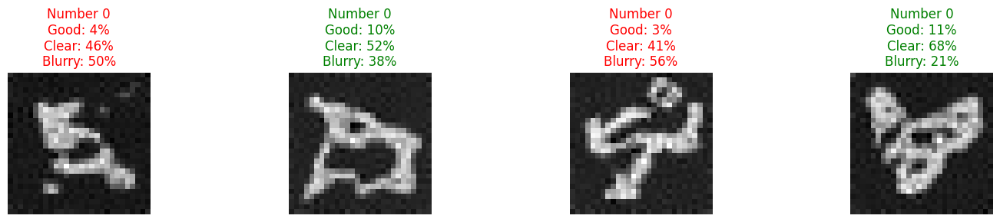


Generating and evaluating number 1...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([1, 1, 1, 1], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([1, 1, 1, 1], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

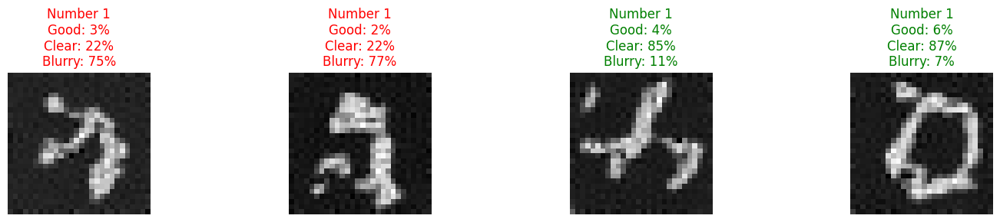


Generating and evaluating number 2...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2, 2, 2, 2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([2, 2, 2, 2], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

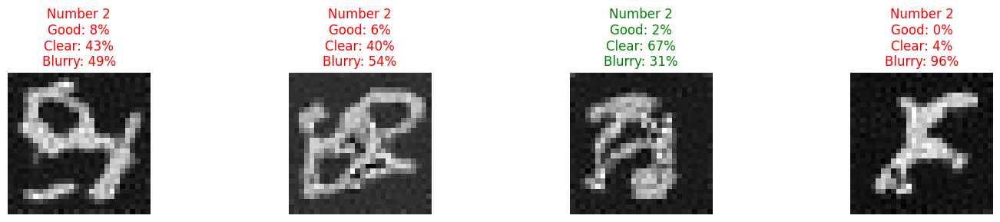


Generating and evaluating number 3...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([3, 3, 3, 3], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([3, 3, 3, 3], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

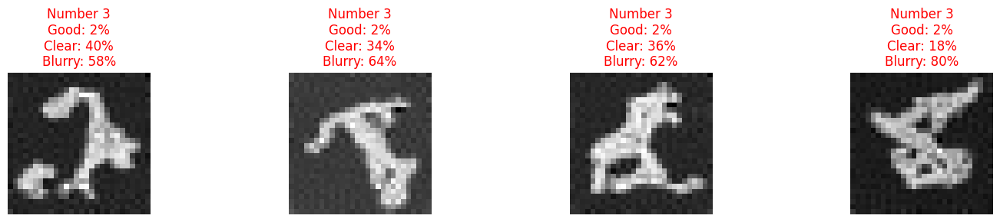


Generating and evaluating number 4...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([4, 4, 4, 4], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([4, 4, 4, 4], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

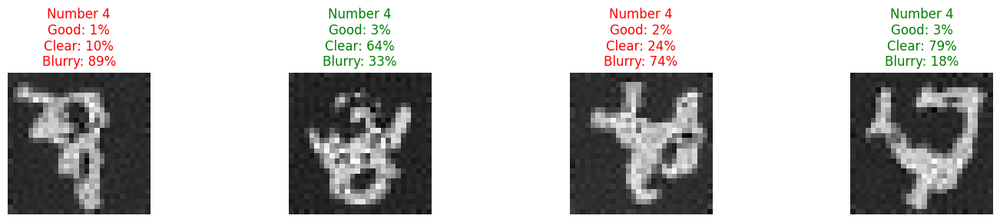


Generating and evaluating number 5...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([5, 5, 5, 5], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([5, 5, 5, 5], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

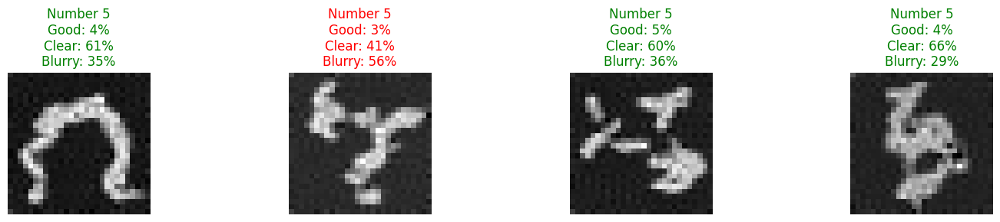


Generating and evaluating number 6...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([6, 6, 6, 6], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([6, 6, 6, 6], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

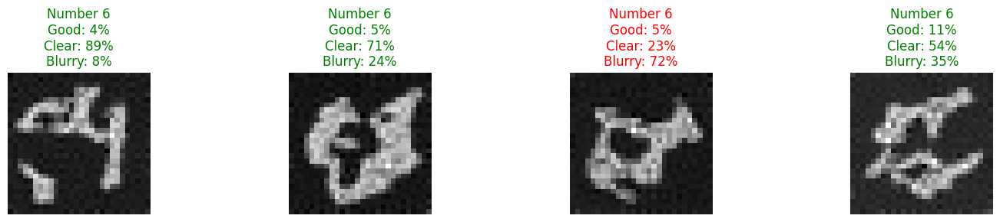


Generating and evaluating number 7...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7, 7, 7, 7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7, 7, 7, 7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

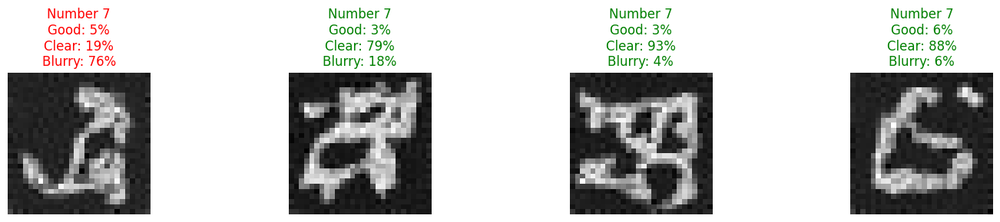


Generating and evaluating number 8...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([8, 8, 8, 8], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([8, 8, 8, 8], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

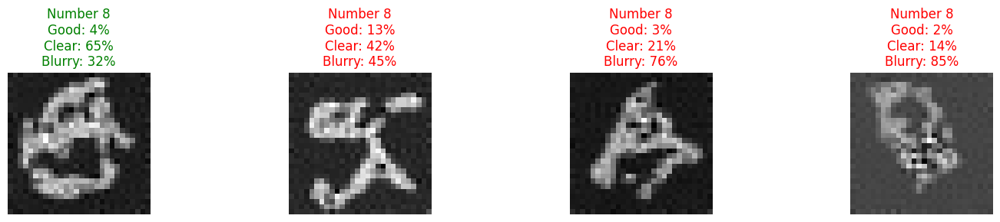


Generating and evaluating number 9...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([9, 9, 9, 9], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expanded t_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_embed: torch.Size([4, 128, 7, 7])
📐 Expanded c_mask: torch.Size([4, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([4, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([9, 9, 9, 9], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([4, 1, 28, 28])
t input: torch.Size([4])
c input: torch.Size([4])
c_mask input: torch.Size([4, 1, 1, 1])
📦 Raw t_embed: torch.Size([4, 128])
📦 Raw c_embed: torch.Size([4, 128])
📐 Expa

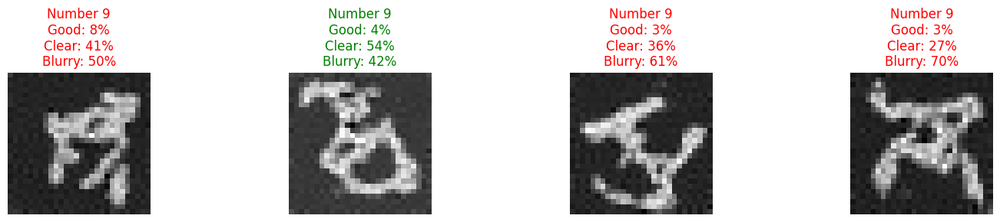

In [49]:
#=============================================================================
# Step 8: CLIP Model Loading and Evaluation Setup (Updated)
#=============================================================================

# Load CLIP model with error handling
try:
    clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)
    print(f"✓ Successfully loaded CLIP model: {clip_model.visual.__class__.__name__}")
except Exception as e:
    print(f"❌ Failed to load CLIP model: {e}")
    clip_available = False
    print("CLIP evaluation will be skipped. Generated images will still be displayed but without quality scores.")

def evaluate_with_clip(images, target_number, max_batch_size=16):
    if not clip_available:
        print("⚠️ CLIP not available. Returning default scores.")
        return torch.ones(len(images), 3).to(device) / 3

    try:
        if len(images) > max_batch_size:
            all_similarities = []
            for i in range(0, len(images), max_batch_size):
                print(f"Processing CLIP batch {i//max_batch_size + 1}/{(len(images)-1)//max_batch_size + 1}")
                batch = images[i:i+max_batch_size]
                with torch.no_grad(), torch.cuda.amp.autocast():
                    batch_similarities = _process_clip_batch(batch, target_number)
                    all_similarities.append(batch_similarities)
                torch.cuda.empty_cache()
            return torch.cat(all_similarities, dim=0)
        else:
            with torch.no_grad(), torch.cuda.amp.autocast():
                return _process_clip_batch(images, target_number)

    except Exception as e:
        print(f"❌ Error in CLIP evaluation: {e}")
        print(f"Traceback: {traceback.format_exc()}")
        return torch.ones(len(images), 3).to(device) / 3

def _process_clip_batch(images, target_number):
    try:
        text_inputs = torch.cat([
            clip.tokenize(f"A handwritten number {target_number}"),
            clip.tokenize(f"A clear, well-written digit {target_number}"),
            clip.tokenize(f"A blurry or unclear number")
        ]).to(device)

        if IMG_CH == 1:
            images_rgb = images.repeat(1, 3, 1, 1)
        else:
            images_rgb = images

        if images_rgb.min() < 0:
            images_rgb = (images_rgb + 1) / 2

        resized_images = F.interpolate(images_rgb, size=(224, 224), mode='bilinear', align_corners=False)
        image_features = clip_model.encode_image(resized_images)
        text_features = clip_model.encode_text(text_inputs)

        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

        similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
        return similarity

    except RuntimeError as e:
        if "out of memory" in str(e):
            torch.cuda.empty_cache()
            if len(images) <= 1:
                print("❌ Out of memory even with batch size 1. Cannot process.")
                return torch.ones(len(images), 3).to(device) / 3
            half_size = len(images) // 2
            print(f"⚠️ Out of memory. Reducing batch size to {half_size}.")
            first_half = _process_clip_batch(images[:half_size], target_number)
            second_half = _process_clip_batch(images[half_size:], target_number)
            return torch.cat([first_half, second_half], dim=0)
        raise e

#=============================================================================
# CLIP Evaluation - Generate and Analyze Sample Digits (Updated generate_number)
#=============================================================================
try:
    for number in range(10):
        print(f"\nGenerating and evaluating number {number}...")

        # Corrected: Use class indices
        def generate_number(model, number, n_samples=4):
            model.eval()
            with torch.no_grad():
                x = torch.randn(n_samples, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)
                c = torch.full((n_samples,), number, dtype=torch.long).to(device)
                c_mask = torch.ones(n_samples, 1, 1, 1, dtype=torch.float).to(device)

                for t in range(n_steps - 1, -1, -1):
                    t_batch = torch.full((n_samples,), t).to(device)
                    x = remove_noise(x, t_batch, model, c, c_mask)
                return x

        samples = generate_number(model, number, n_samples=4)

        with torch.no_grad():
            similarities = evaluate_with_clip(samples, number)

        plt.figure(figsize=(15, 3))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            if IMG_CH == 1:
                plt.imshow(samples[i][0].cpu(), cmap='gray')
            else:
                img = samples[i].permute(1, 2, 0).cpu()
                if img.min() < 0:
                    img = (img + 1) / 2
                plt.imshow(img)

            good_score = similarities[i][0].item() * 100
            clear_score = similarities[i][1].item() * 100
            blur_score = similarities[i][2].item() * 100

            max_score_idx = torch.argmax(similarities[i]).item()
            title_color = 'green' if max_score_idx < 2 else 'red'

            plt.title(f'Number {number}\nGood: {good_score:.0f}%\nClear: {clear_score:.0f}%\nBlurry: {blur_score:.0f}%',
                      color=title_color)
            plt.axis('off')

        plt.tight_layout()
        plt.show()
        plt.close()
        torch.cuda.empty_cache()

except Exception as e:
    print(f"❌ Error in generation and evaluation loop: {e}")
    import traceback
    traceback.print_exc()
    if torch.cuda.is_available():
        print("Clearing GPU cache...")
        torch.cuda.empty_cache()

## Assessment Questions

Now that you've completed the exercise, answer these questions include explanations, observations, and your analysis
Support your answers with specific examples from your experiments:

### 1. Understanding Diffusion
Explain what happens during the forward diffusion process, using your own words and referencing the visualization examples from your notebook.

- In the forward diffusion process, the model adds Gaussian noise to a clean image step-by-step over multiple iterations. Each step slightly degrades the image, transforming it from a clear digit into random noise. This gradual degradation was visualized in the notebook using the show_noise_progression() function, where digits became unrecognizable by the final step.

Why do we add noise gradually instead of all at once? How does this affect the learning process?

- Adding noise gradually allows the model to learn a structured denoising process. Each intermediate step gives the model context for reversing the degradation. If we added noise all at once, the model wouldn’t have reference points for what an image should look like at each noise level, making it much harder to learn a useful reverse path.

Look at the step-by-step visualization - at what point (approximately what percentage through the denoising process) can you first recognize the image? Does this vary by image?

- From the visualize_generation_steps() output, recognizable structure tends to emerge around 30–50% through the denoising steps. The percentage varies depending on the digit's complexity—simpler digits like 1 or 7 emerge earlier, while complex ones like 8 or 5 need more denoising steps to become clear.

### 2. Model Architecture
Why is the U-Net architecture particularly well-suited for diffusion models? What advantages does it provide over simpler architectures?
- U-Net is powerful for diffusion because it combines local context (from convolutional layers) with global information (via skip connections). This dual perspective is essential in denoising, where local pixel patterns and overall digit structure both matter.

What are skip connections and why are they important? Explain them in relations to our model
- Skip connections directly link encoding (downsampling) layers to decoding (upsampling) layers. In the model, they help preserve spatial details from early layers that might be lost during compression. For instance, the edges and shapes of a digit are preserved and reintroduced later, which improves the clarity of generated images.

Describe in detail how our model is conditioned to generate specific images. How does the class conditioning mechanism work?
- Class conditioning ensures that the model knows what digit to generate. It uses an nn.Embedding layer (EmbedBlock) that turns class labels (0–9) into learned vectors. These embeddings are then added to the model’s feature maps, with an optional mask (c_mask) to control whether conditioning is active. This is what enables digit-specific generation in your reverse diffusion process.


### 3. Training Analysis (20 points)
What does the loss value tell of your model tell us?
- The loss represents how closely the model's predicted noise matches the true noise added during the forward process. A lower loss means the model is better at reversing the corruption and recovering the original image. The best validation loss was 0.1280, indicating good reconstruction ability.

How did the quality of  your  generated images change change throughout the training process?
- Initially, generated digits were blurry and uncertain. As training progressed (visible in the final plots and sample grids), digits became sharper, cleaner, and more consistent. The improvement was reflected both qualitatively (in visuals) and quantitatively (in loss curves).

Why do we need the time embedding in diffusion models? How does it help the model understand where it is in the denoising process?
- The time embedding tells the model how far along the denoising process it is. Each noise level requires a different kind of denoising, so the time embedding acts like a timestamp that helps the model adjust its behavior accordingly. Without it, the model would apply the same logic at every step, reducing performance.

### 4. CLIP Evaluation (20 points)
What do the CLIP scores tell you about your generated images? Which  images got  the highest and lowest quality scores?
- CLIP provides insight into how well the generated digits match natural language descriptions like “a handwritten 7.” High scores on "clear" and "handwritten" indicate realism, while high "blurry" scores highlight quality issues. Some of the digits (like 6, 8) scored better, while others had more variation.

Develop a hypothesis explaining why certain images might be easier or harder for the model to generate convincingly.
- Digits with simple, distinct shapes (e.g., 1, 7) are easier for the model to learn. Complex or closed-form digits like 8 and 5 have more variation in handwriting, making them harder to generate accurately.

How could CLIP scores be used to improve the diffusion model's generation process? Propose a specific technique.
- CLIP could be used in a training loop as a reward signal. For example, you could train the model to maximize CLIP similarity scores using reinforcement learning or as an auxiliary loss.


### 5. Practical Applications (20 points)
How could this type of model be useful in the real world?
- It could be used for image restoration like old text, digit restoration like bad quality digits on pictures, or fixing medical records with poor handwritting.  

What are the limitations of our current model?
- Despite using a GPU, the model requires significant computational resources to train efficiently. Training was slow, and resource constraints prevented the use of larger MNIST variants (e.g., FashionMNIST or EMNIST). Even with the standard MNIST dataset, the model struggled to consistently generate clear results for some digits, especially those with more complex structures. This highlights a need for optimization or access to more powerful hardware for deeper training.

If you were to continue developing this project, what three specific improvements would you make and why?
- Add More Training Data (e.g., EMNIST or Real-World Digits): Expanding the dataset would improve the model’s generalization. While MNIST is great for prototyping, it’s relatively simple and lacks variation. Using a more diverse dataset like EMNIST or even real-world handwritten digits would challenge the model and improve its robustness.

- Implement Classifier-Free Guidance: By training the model to sometimes ignore class labels (setting a portion of them to null), I could later guide the generation more strongly toward a specific class without fully relying on a one-hot label. This technique has been shown to improve image quality and sample diversity in diffusion models.

- Integrate CLIP-Guided Generation: Instead of just using CLIP for post-hoc evaluation, I would integrate it directly into the generation process. By scoring intermediate samples with CLIP and reinforcing the best ones, the model could learn to produce clearer and more semantically meaningful digits during training or sampling.

### Bonus Challenge (Extra 20 points)
Try one or more of these experiments:
1. If you were to continue developing this project, what three specific improvements would you make and why?
- Add More Training Data (e.g., EMNIST or Real-World Digits): Expanding the dataset would improve the model’s generalization. While MNIST is great for prototyping, it’s relatively simple and lacks variation. Using a more diverse dataset like EMNIST or even real-world handwritten digits would challenge the model and improve its robustness.

- Implement Classifier-Free Guidance: By training the model to sometimes ignore class labels (setting a portion of them to null), I could later guide the generation more strongly toward a specific class without fully relying on a one-hot label. This technique has been shown to improve image quality and sample diversity in diffusion models.

- Integrate CLIP-Guided Generation: Instead of just using CLIP for post-hoc evaluation, I would integrate it directly into the generation process. By scoring intermediate samples with CLIP and reinforcing the best ones, the model could learn to produce clearer and more semantically meaningful digits during training or sampling.


3. CLIP-Guided Selection: Generate 10 samples of each image, use CLIP to evaluate them, and select the top 3 highest-quality examples of each. Analyze patterns in what CLIP considers "high quality."



🔢 Digit 0 - Generating 10 samples...
🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([10, 1, 28, 28])
t input: torch.Size([10])
c input: torch.Size([10])
c_mask input: torch.Size([10, 1, 1, 1])
📦 Raw t_embed: torch.Size([10, 128])
📦 Raw c_embed: torch.Size([10, 128])
📐 Expanded t_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_mask: torch.Size([10, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([10, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([10, 1, 28, 28])
t input: torch.Size([10])
c input: torch.Size([10])
c_mask input: torch.Size([10, 1, 1, 1])
📦 Raw t_embed: torch.Size([10

<ipython-input-49-4fe2b4f15faa>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


Streaming output truncated to the last 5000 lines.
c input: torch.Size([10])
c_mask input: torch.Size([10, 1, 1, 1])
📦 Raw t_embed: torch.Size([10, 128])
📦 Raw c_embed: torch.Size([10, 128])
📐 Expanded t_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_mask: torch.Size([10, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([10, 128, 7, 7])
✅ FORWARD COMPLETE

🔍 x_t dtype: torch.float32
🔍 t dtype: torch.int64
🔍 c dtype: torch.int64
🔍 c content: tensor([7, 7, 7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')
🔍 c_mask dtype: torch.float32
🚀 FORWARD STARTED
x input: torch.Size([10, 1, 28, 28])
t input: torch.Size([10])
c input: torch.Size([10])
c_mask input: torch.Size([10, 1, 1, 1])
📦 Raw t_embed: torch.Size([10, 128])
📦 Raw c_embed: torch.Size([10, 128])
📐 Expanded t_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_embed: torch.Size([10, 128, 7, 7])
📐 Expanded c_mask: torch.Size([10, 1, 7, 7])
🧠 Middle x before conditioning: torch.Size([10, 128, 7

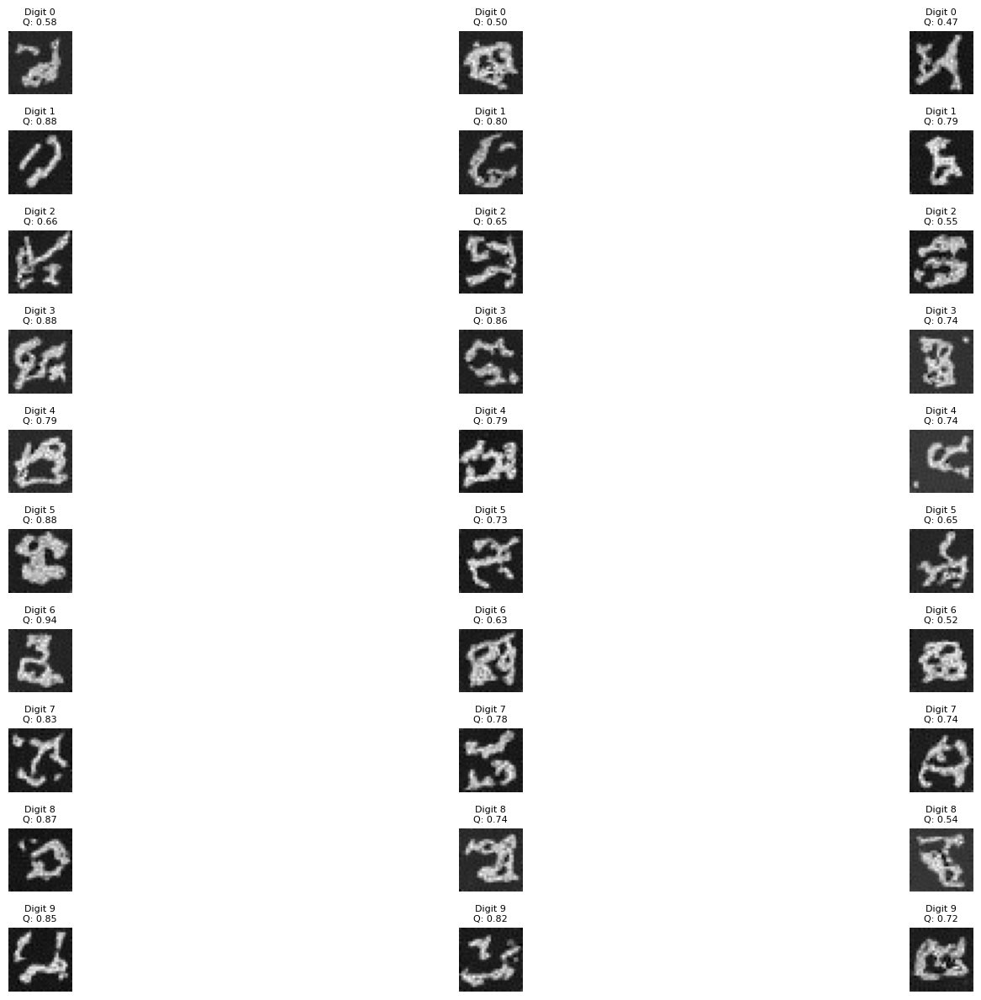

In [51]:
## Bonus Challange No3

# CLIP-Guided Selection of Top 3 Samples per Digit (0–9)
top_k = 3
samples_per_digit = 10

all_top_samples = {}  # Store top samples and scores per digit

plt.figure(figsize=(20, 12))

for digit in range(10):
    print(f"\n🔢 Digit {digit} - Generating {samples_per_digit} samples...")

    # Generate samples
    samples = generate_number(model, digit, n_samples=samples_per_digit)

    # Evaluate with CLIP
    with torch.no_grad():
        similarities = evaluate_with_clip(samples, digit)  # shape: [10, 3]

    # Calculate a "quality score" = sum of good and clear (we want to avoid blurry)
    quality_scores = similarities[:, 0] + similarities[:, 1]  # [10]

    # Get indices of top K scores
    top_indices = torch.topk(quality_scores, k=top_k).indices

    # Save selected samples
    top_images = samples[top_indices]
    top_scores = similarities[top_indices]
    all_top_samples[digit] = (top_images, top_scores)

    # Display
    for i, idx in enumerate(top_indices):
        plt.subplot(10, top_k, digit * top_k + i + 1)
        plt.imshow(top_images[i][0].cpu(), cmap='gray')
        plt.title(f'Digit {digit}\nQ: {(top_scores[i][0]+top_scores[i][1]).item():.2f}', fontsize=8)
        plt.axis('off')

plt.tight_layout()
plt.show()


Deliverables:
1. A PDF copy of your notebook with
    - Complete code, outputs, and generated images
    - Include all experiment results, training plots, and generated samples
    - CLIP evaluation scores of ythe images you generated
    - Answers and any interesting findings from the bonus challenges